# Figure 2: Population-Level Patterns

## Purpose
Show population-level disease signature patterns and their temporal evolution.

## Panels Required:
- **Panel A:** Heatmap of discovered signatures with top diseases for each
- **Panel B:** Patient clustering based on signature weights
- **Panel C:** Signature prevalence across age cohorts (young vs. old)
- **Panel D:** Temporal evolution of signature prevalence in population

## Key Message:
Focus on trajectory aspects, not just clusters - emphasize temporal dynamics


In [ ]:
# Setup
import sys
import os
sys.path.append('/Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/')

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Set style for publication-quality figures
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 9
plt.rcParams['figure.titlesize'] = 16
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans', 'Helvetica', 'Liberation Sans']

print("Setup complete")


Setup complete


In [ ]:
# Define plotting functions
from scipy.special import expit as sigmoid

def plot_single_signature(phi_np, clusters_np, disease_names, signature_idx,
                          age_offset=30, figsize=(10, 7), top_n_diseases=None, 
                          plot_probability=False, prevalence_t_np=None, logit_prev_t_np=None):
    """
    Plot a single signature with prettier styling for publication.
    
    Parameters:
    -----------
    phi_np : np.ndarray, shape (K, D, T)
        Phi values (log hazard ratios) for each signature, disease, and timepoint
    clusters_np : np.ndarray, shape (D,)
        Disease-to-signature assignments
    disease_names : list
        List of disease names
    signature_idx : int
        Signature index to plot
    age_offset : int
        Age offset (timepoint 0 = age_offset)
    figsize : tuple
        Figure size (width, height)
    top_n_diseases : int or None
        If specified, plot only top N signature-specific diseases based on max phi value
    plot_probability : bool
        If True, convert phi to probability using sigmoid. If False, plot log hazard ratio.
    prevalence_t_np : np.ndarray or None, shape (D, T)
        Smoothed prevalence for each disease and timepoint. If provided, will be overlaid.
    logit_prev_t_np : np.ndarray or None, shape (D, T)
        Logit prevalence for each disease and timepoint. If provided, will be overlaid as probability.
    
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure object
    """
    K, D, T = phi_np.shape
    age_points = np.arange(T) + age_offset
    
    # Convert to probability if requested
    if plot_probability:
        plot_values = sigmoid(phi_np)
        y_label = 'Probability'
    else:
        plot_values = phi_np
        y_label = 'Log Hazard Ratio'
    
    # Create single figure
    fig, ax = plt.subplots(figsize=figsize)
    
    k = signature_idx
    
    # Find diseases assigned to this signature
    sig_disease_indices = np.where(clusters_np == k)[0]
    
    # Find all other diseases (background)
    background_disease_indices = np.where(clusters_np != k)[0]
    
    # Plot background diseases in light grey
    for d in background_disease_indices:
        ax.plot(age_points, plot_values[k, d, :], 
               color='lightgray', alpha=0.15, linewidth=0.5, zorder=1)
    
    # Plot signature-specific diseases in colored lines
    if len(sig_disease_indices) > 0:
        # Optionally select top N diseases
        if top_n_diseases is not None and len(sig_disease_indices) > top_n_diseases:
            # Rank by max value
            max_values = np.max(plot_values[k, sig_disease_indices, :], axis=1)
            top_indices = np.argsort(max_values)[-top_n_diseases:]
            sig_disease_indices = sig_disease_indices[top_indices]
        
        # Use a nice color palette
        n_colors = len(sig_disease_indices)
        if n_colors <= 10:
            colors = plt.cm.tab10(np.linspace(0, 1, n_colors))
        else:
            colors = plt.cm.Set3(np.linspace(0, 1, n_colors))
        
        for i, d in enumerate(sig_disease_indices):
            color = colors[i]
            disease_name = disease_names[d] if d < len(disease_names) else f"Disease_{d}"
            
            # Plot model's learned phi
            ax.plot(age_points, plot_values[k, d, :], 
                   color=color, linewidth=2.5, label=disease_name, zorder=3, alpha=0.9)
            
            # Overlay smoothed prevalence if available
            if prevalence_t_np is not None and d < prevalence_t_np.shape[0]:
                if isinstance(prevalence_t_np, torch.Tensor):
                    prev_values = prevalence_t_np[d, :].detach().cpu().numpy()
                else:
                    prev_values = prevalence_t_np[d, :]
                ax.plot(age_points, prev_values, 
                       color=color, linewidth=1.8, linestyle='--', 
                       alpha=0.5, label=f'{disease_name} (prev)', zorder=2)
    
    # Styling
    ax.set_title(f'Signature {k}', fontsize=16, fontweight='bold', pad=15)
    ax.set_xlabel('Age (years)', fontsize=13, fontweight='bold')
    ax.set_ylabel(y_label, fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, color='gray')
    ax.set_xlim(age_points[0], age_points[-1])
    
    # Set y-axis limits based on data range
    if len(sig_disease_indices) > 0:
        sig_data = plot_values[k, sig_disease_indices, :]
        y_min = max(0, np.min(sig_data) * 0.95) if plot_probability else np.min(sig_data) * 1.05
        y_max = np.max(sig_data) * 1.05
        
        # Also consider prevalence if available
        if prevalence_t_np is not None:
            if isinstance(prevalence_t_np, torch.Tensor):
                prev_data = prevalence_t_np[sig_disease_indices, :].detach().cpu().numpy()
            else:
                prev_data = prevalence_t_np[sig_disease_indices, :]
            y_min = min(y_min, max(0, np.min(prev_data) * 0.95))
            y_max = max(y_max, np.max(prev_data) * 1.05)
        
        ax.set_ylim(y_min, y_max)
    
    # Add legend
    if len(sig_disease_indices) > 0:
        ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9, 
                 framealpha=0.95, edgecolor='gray', fancybox=True, frameon=True)
    
    plt.tight_layout()
    return fig

def plot_signature_phi_patterns(phi_np, clusters_np, disease_names, selected_signatures=None, 
                                  age_offset=30, figsize=(8, 5), top_n_diseases=None, 
                                  plot_probability=True, prevalence_t_np=None, logit_prev_t_np=None):
    """
    Plot phi values (as probability or log hazard ratio) for signature-specific diseases (colored) 
    vs background diseases (in grey), arranged vertically. Optionally overlay prevalence and logit prevalence.
    
    Parameters:
    -----------
    phi_np : np.ndarray, shape (K, D, T)
        Phi values (log hazard ratios) for each signature, disease, and timepoint
    clusters_np : np.ndarray, shape (D,)
        Disease-to-signature assignments
    disease_names : list
        List of disease names
    selected_signatures : list or None
        List of signature indices to plot. If None, plot all signatures.
    age_offset : int
        Age offset (timepoint 0 = age_offset)
    figsize : tuple
        Figure size per signature subplot (width, height)
    top_n_diseases : int or None
        If specified, plot only top N signature-specific diseases based on max phi value
    plot_probability : bool
        If True, convert phi to probability using sigmoid. If False, plot log hazard ratio.
    prevalence_t_np : np.ndarray or None, shape (D, T)
        Smoothed prevalence for each disease and timepoint. If provided, will be overlaid.
    logit_prev_t_np : np.ndarray or None, shape (D, T)
        Logit prevalence for each disease and timepoint. If provided, will be overlaid as probability.
    """
    K, D, T = phi_np.shape
    
    if selected_signatures is None:
        selected_signatures = list(range(K))
    
    n_sigs = len(selected_signatures)
    age_points = np.arange(T) + age_offset
    
    # Convert to probability if requested
    if plot_probability:
        plot_values = sigmoid(phi_np)
        y_label = 'Prob (disease | sig k, age)'
    else:
        plot_values = phi_np
        y_label = 'Log hazard ratio'
    
    # Create subplots in a grid (3 rows x 5 cols for 15 signatures)
    n_cols = 5
    n_rows = (n_sigs + n_cols - 1) // n_cols  # Ceiling division
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize[0] * n_cols, figsize[1] * n_rows), 
                             sharex=True, sharey=False)
    
    # Convert axes to a flat array for easier indexing
    if n_sigs == 1:
        axes_flat = np.array([axes]).flatten()
    elif n_rows == 1:
        axes_flat = np.array(axes).flatten()
    else:
        axes_flat = axes.flatten()
    
    for idx, k in enumerate(selected_signatures):
        ax = axes_flat[idx]
        
        # Find diseases assigned to this signature
        sig_disease_indices = np.where(clusters_np == k)[0]
        
        # Find all other diseases (background)
        background_disease_indices = np.where(clusters_np != k)[0]
        
        # Plot background diseases in grey
        for d in background_disease_indices:
            ax.plot(age_points, plot_values[k, d, :], 
                   color='grey', alpha=0.2, linewidth=0.3, zorder=1)
        
        # Plot signature-specific diseases in colored lines
        if len(sig_disease_indices) > 0:
            # Optionally select top N diseases
            if top_n_diseases is not None and len(sig_disease_indices) > top_n_diseases:
                # Rank by max value
                max_values = np.max(plot_values[k, sig_disease_indices, :], axis=1)
                top_indices = np.argsort(max_values)[-top_n_diseases:]
                sig_disease_indices = sig_disease_indices[top_indices]
            
            # Use different colors for signature-specific diseases
            colors = plt.cm.tab10(np.linspace(0, 1, min(len(sig_disease_indices), 10)))
            for i, d in enumerate(sig_disease_indices):
                color = colors[i % len(colors)] if len(sig_disease_indices) <= 10 else 'red'
                disease_name = disease_names[d] if d < len(disease_names) else f"Disease_{d}"
                
                # Plot model's learned phi (as probability)
                ax.plot(age_points, plot_values[k, d, :], 
                       color=color, linewidth=2.5, label=disease_name, zorder=2)
                
                # Overlay smoothed prevalence if available
                if prevalence_t_np is not None and d < prevalence_t_np.shape[0]:
                    # Convert to numpy if it's a torch tensor
                    if isinstance(prevalence_t_np, torch.Tensor):
                        prev_values = prevalence_t_np[d, :].detach().cpu().numpy()
                    else:
                        prev_values = prevalence_t_np[d, :]
                    ax.plot(age_points, prev_values, 
                           color=color, linewidth=1.5, linestyle='--', 
                           alpha=0.6, label=f'{disease_name} (prev)', zorder=3)
                
                # Overlay logit prevalence (converted to probability) if available
                if logit_prev_t_np is not None and d < logit_prev_t_np.shape[0]:
                    # Convert to numpy if it's a torch tensor
                    if isinstance(logit_prev_t_np, torch.Tensor):
                        logit_prev_values = logit_prev_t_np[d, :].detach().cpu().numpy()
                    else:
                        logit_prev_values = logit_prev_t_np[d, :]
                    logit_prev_prob = sigmoid(logit_prev_values)
                    ax.plot(age_points, logit_prev_prob, 
                           color=color, linewidth=1.5, linestyle=':', 
                           alpha=0.6, label=f'{disease_name} (logit prev)', zorder=3)
        
        ax.set_title(f'Signature {k}', fontsize=12, fontweight='bold', pad=5)
        if idx >= (n_rows - 1) * n_cols:  # Only label x-axis on bottom row
            ax.set_xlabel('Age (yr)', fontsize=10)
        if idx % n_cols == 0:  # Only label y-axis on left column
            ax.set_ylabel(y_label, fontsize=10)
        ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
        ax.set_xlim(age_points[0], age_points[-1])
        
        # Set y-axis limits based on data range for this signature
        if len(sig_disease_indices) > 0:
            sig_data = plot_values[k, sig_disease_indices, :]
            y_min = max(0, np.min(sig_data) * 0.9) if plot_probability else np.min(sig_data) * 1.1
            y_max = np.max(sig_data) * 1.1
            
            # Also consider prevalence and logit prevalence if available
            if prevalence_t_np is not None:
                # Convert to numpy if it's a torch tensor
                if isinstance(prevalence_t_np, torch.Tensor):
                    prev_data = prevalence_t_np[sig_disease_indices, :].detach().cpu().numpy()
                else:
                    prev_data = prevalence_t_np[sig_disease_indices, :]
                y_min = min(y_min, max(0, np.min(prev_data) * 0.9))
                y_max = max(y_max, np.max(prev_data) * 1.1)
            
            if logit_prev_t_np is not None:
                # Convert to numpy if it's a torch tensor
                if isinstance(logit_prev_t_np, torch.Tensor):
                    logit_prev_t_np_numpy = logit_prev_t_np.detach().cpu().numpy()
                else:
                    logit_prev_t_np_numpy = logit_prev_t_np
                logit_prev_prob_data = sigmoid(logit_prev_t_np_numpy[sig_disease_indices, :])
                y_min = min(y_min, max(0, np.min(logit_prev_prob_data) * 0.9))
                y_max = max(y_max, np.max(logit_prev_prob_data) * 1.1)
            
            ax.set_ylim(y_min, y_max)
        
        # Add legend if there are signature-specific diseases (only for first few to avoid clutter)
        if len(sig_disease_indices) > 0 and len(sig_disease_indices) <= 10 and idx < 3:  # Only show legend for first 3 signatures
            ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=6, 
                     framealpha=0.9, edgecolor='gray', fancybox=True)
    
    # Hide unused subplots
    for idx in range(n_sigs, n_rows * n_cols):
        axes_flat[idx].set_visible(False)
    
    plt.tight_layout(rect=[0, 0, 0.95, 1])  # Leave space for legend
    return fig

print("Plotting functions defined!")


Plotting functions defined!


## Panel A: Signature-Disease Heatmap

Show heatmap of signatures with top diseases for each. 

**Note:** We can use the existing `plot_disease_blocks` function from `utils.py` which creates heatmaps showing cluster correspondence between biobanks. This shows how diseases are assigned to signatures (clusters).


In [7]:
# Load data
from helper_py.pathway_discovery import load_full_data

# Load UKB model checkpoint to get clusters (disease-signature assignments)
import torch

# Load model checkpoints for cross-cohort comparison
# Note: plot_disease_blocks shows cluster correspondence between biobanks
# For main paper, we may want to show UKB signature-disease assignments

ukb_checkpoint_path = '/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam.pt'
ukb_checkpoint = torch.load(ukb_checkpoint_path, map_location='cpu')

print(f"UKB checkpoint keys: {list(ukb_checkpoint.keys())}")
print(f"Number of diseases: {len(ukb_checkpoint['disease_names'])}")
print(f"Number of signatures: {ukb_checkpoint['clusters'].max() + 1 if hasattr(ukb_checkpoint['clusters'], 'max') else 'N/A'}")

# Extract clusters (disease-to-signature assignments)
clusters = ukb_checkpoint['clusters']
disease_names = ukb_checkpoint['disease_names']

# Convert to list if needed
if isinstance(disease_names, (list, tuple)):
    disease_names = list(disease_names)
elif hasattr(disease_names, 'values'):
    disease_names = disease_names.values.tolist()


UKB checkpoint keys: ['model_state_dict', 'clusters', 'initial_phi', 'initial_lambda', 'psi', 'Y', 'prevalence_t', 'logit_prevalence_t', 'G', 'E', 'indices', 'disease_names', 'hyperparameters']
Number of diseases: 348
Number of signatures: 20


In [8]:
# Create signature-disease heatmap
# Option 1: Use existing plot_disease_blocks for cross-cohort comparison
# Option 2: Create new heatmap showing UKB signature-disease assignments

# For main paper Figure 2A, we want to show:
# - Each signature (column) with top diseases (rows)
# - Diseases clustered within each signature based on their psi/phi associations

# Load psi matrix (disease-signature associations)
if 'psi' in ukb_checkpoint:
    psi = ukb_checkpoint['psi']
    print(f"Psi shape: {psi.shape}")
    
    # Create heatmap of psi values
    # Rows: diseases, Columns: signatures
    # This shows the strength of association between each disease and signature
    
    # TODO: Create publication-ready heatmap
    # - Show top diseases for each signature
    # - Cluster diseases within signatures
    # - Use appropriate color scale
    # - Add labels and legend
else:
    print("Psi matrix not found in checkpoint")
    print("Available keys:", list(ukb_checkpoint.keys()))


Psi shape: torch.Size([21, 348])


Loaded master checkpoint:
  Phi shape: (21, 348, 52)
  Clusters shape: (348,)
  Prevalence shape: (348, 52)


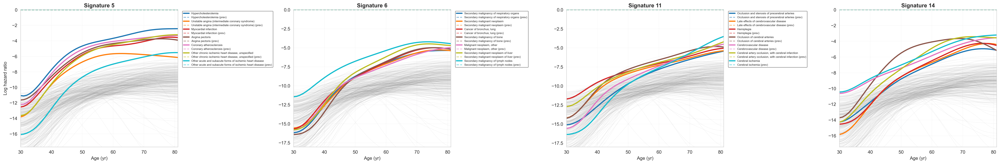

In [9]:
# Load master checkpoint with pooled phi from corrected E
master_checkpoint = torch.load('/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/master_for_fitting_pooled_correctedE.pt', map_location='cpu')
phi_np = master_checkpoint['model_state_dict']['phi'].numpy()

# Load clusters from old checkpoint (clusters don't change)
ukb_checkpoint_path = '/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam.pt'
ukb_checkpoint = torch.load(ukb_checkpoint_path, map_location='cpu')
clusters_np = ukb_checkpoint['clusters']

# Load corrected prevalence
prevalence_t_np = torch.load('/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/prevalence_t_corrected.pt', map_location='cpu')
if torch.is_tensor(prevalence_t_np):
    prevalence_t_np = prevalence_t_np.numpy()

# Get disease names
disease_names = ukb_checkpoint['disease_names']
if isinstance(disease_names, (list, tuple)):
    disease_names = list(disease_names)
elif hasattr(disease_names, 'values'):
    disease_names = disease_names.values.tolist()

print(f"Loaded master checkpoint:")
print(f"  Phi shape: {phi_np.shape}")
print(f"  Clusters shape: {clusters_np.shape if hasattr(clusters_np, 'shape') else len(clusters_np)}")
print(f"  Prevalence shape: {prevalence_t_np.shape}")

selected_sigs = [5, 6, 11, 14]
fig = plot_signature_phi_patterns(phi_np, clusters_np, disease_names, 
                                  selected_signatures=selected_sigs,
                                  top_n_diseases=7,  # Show top 7 signature-specific diseases
                                  plot_probability=False,  # Plot log hazard ratio (not probability)
                                  prevalence_t_np=prevalence_t_np)  # Overlay prevalence
plt.show()

In [11]:
%run /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/main_paper_figures/generate_fig2_signatures.py

Loading data...
Loaded master checkpoint:
  Phi shape: (21, 348, 52)
  Clusters shape: (348,)
  Prevalence shape: (348, 52)

Output directory: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2

Plotting Signature 5...
  ✓ Saved to: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2/fig2_signature_5.pdf

Plotting Signature 6...
  ✓ Saved to: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2/fig2_signature_6.pdf

Plotting Signature 11...
  ✓ Saved to: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2/fig2_signature_11.pdf

Plotting Signature 14...
  ✓ Saved to: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2/fig2_signature_14.pdf

✓ All figures saved to: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2


In [10]:
%run /Users/sarahurbut/aladynoulli2/pyScripts_forPublish/check_max_sig_vs_initial_clusters.py   


Found 40 matching model files:
  - enrollment_model_W0.0001_batch_0_10000.pt
  - enrollment_model_W0.0001_batch_100000_110000.pt
  - enrollment_model_W0.0001_batch_10000_20000.pt
  - enrollment_model_W0.0001_batch_110000_120000.pt
  - enrollment_model_W0.0001_batch_120000_130000.pt
  - enrollment_model_W0.0001_batch_130000_140000.pt
  - enrollment_model_W0.0001_batch_140000_150000.pt
  - enrollment_model_W0.0001_batch_150000_160000.pt
  - enrollment_model_W0.0001_batch_160000_170000.pt
  - enrollment_model_W0.0001_batch_170000_180000.pt
  - enrollment_model_W0.0001_batch_180000_190000.pt
  - enrollment_model_W0.0001_batch_190000_200000.pt
  - enrollment_model_W0.0001_batch_200000_210000.pt
  - enrollment_model_W0.0001_batch_20000_30000.pt
  - enrollment_model_W0.0001_batch_210000_220000.pt
  - enrollment_model_W0.0001_batch_220000_230000.pt
  - enrollment_model_W0.0001_batch_230000_240000.pt
  - enrollment_model_W0.0001_batch_240000_250000.pt
  - enrollment_model_W0.0001_batch_250000_2

In [20]:
%run /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/main_paper_figures/generate_prs_signature_plots.py

Output directory: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/prs_signatures
Loaded 36 PRS names from: /Users/sarahurbut/aladynoulli2/prs_names.csv

Loaded 36 PRS names
  First few: ['AAM', 'AMD', 'AD', 'AST', 'AF']

Loading gamma from file: /Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized_noPCS/enrollment_model_VECTORIZED_W0.0001_batch_0_10000.pt
Loading checkpoint: /Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized_noPCS/enrollment_model_VECTORIZED_W0.0001_batch_0_10000.pt
  Found gamma in model_state_dict
  Gamma shape: (37, 21)
  Gamma stats: min=-0.003286, max=0.007765, mean=0.000121

Creating gamma dataframe...
  Note: Gamma has 37 features, extracting first 36 PRS features
  Structure: rows 0-35=PRS, row 36=sex
  Created dataframe: (756, 4)
  Effect range: [-0.001389, 0.007174]

Significance Statistics:
  Associations with |effect| > 0.1: 0 / 756 (0.00%)

Generating plots...

1. Crea

In [22]:
%run /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/main_paper_figures/generate_prs_signature_plots.py \
  --gamma_file /Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_0_10000.pt \
  --output_dir /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/prs_signatures_withPCs

Output directory: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/prs_signatures_withPCs
Loaded 36 PRS names from: /Users/sarahurbut/aladynoulli2/prs_names.csv

Loaded 36 PRS names
  First few: ['AAM', 'AMD', 'AD', 'AST', 'AF']

Loading gamma from file: /Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_0_10000.pt
Loading checkpoint: /Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_0_10000.pt
  Found gamma in model_state_dict
  Gamma shape: (47, 21)
  Gamma stats: min=-0.003287, max=0.007777, mean=0.000111

Creating gamma dataframe...
  Note: Gamma has 47 features, extracting first 36 PRS features
  Structure: rows 0-35=PRS, row 36=sex, rows 37-46=PCs
  Created dataframe: (756, 4)
  Effect range: [-0.001365, 0.007188]

Significance Statistics:
  Associations with |effect| > 0.1: 0 / 756 (0.00%)

Generating plots...

1. Creating top a

Time dimension: 52, Age range: 30-81

UKB cardiovascular signature 5 target diseases (4):
  0: Coronary atherosclerosis (idx 114)
  1: Myocardial infarction (idx 112)
  2: Other chronic ischemic heart disease, unspecified (idx 115)
  3: Unstable angina (intermediate coronary syndrome) (idx 111)

UKB - Cardiovascular signature 5:
  Phi shape: (21, 348, 52)
  Clusters type: <class 'numpy.ndarray'>
  Clusters shape: (348,)
  Unique signatures: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
  Diseases in signature 5: 7
  Matched 4 diseases with UKB:
    0: Coronary atherosclerosis (idx 114)
    1: Myocardial infarction (idx 112)
    2: Other chronic ischemic heart disease, unspecified (idx 115)
    3: Unstable angina (intermediate coronary syndrome) (idx 111)

AOU - Cardiovascular signature 16:
  Phi shape: (21, 348, 51)
  Clusters type: <class 'numpy.ndarray'>
  Clusters shape: (348,)
  Unique signatures: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
  Disea

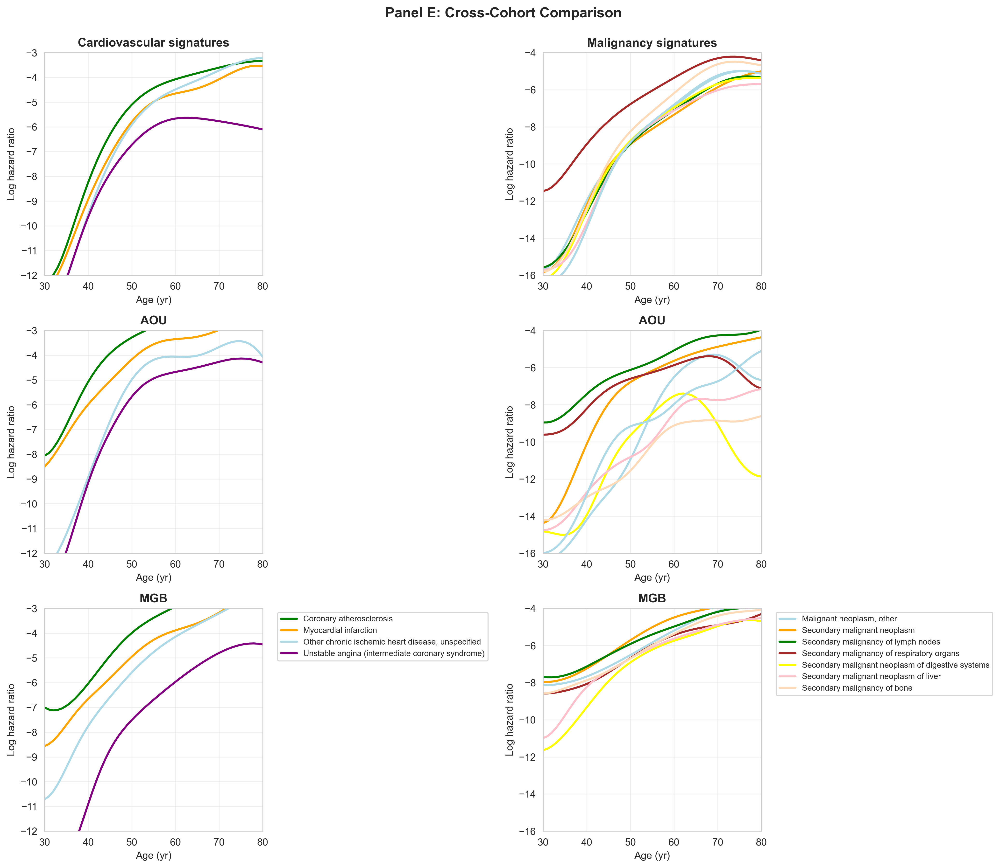

In [138]:
## Panel E: Cross-Cohort Comparison - Cardiovascular and Malignancy Signatures

# Load all three model checkpoints
# UKB: master checkpoint with pooled phi
ukb_master = torch.load('/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/master_for_fitting_pooled_correctedE.pt', map_location='cpu')
ukb_phi = ukb_master['model_state_dict']['phi'].numpy()

# AOU: initialized model
aou_checkpoint = torch.load('/Users/sarahurbut/aladynoulli2/aou_model_initialized.pt', map_location='cpu')
aou_phi = aou_checkpoint['model_state_dict']['phi'].numpy()

# MGB: initialized model
mgb_checkpoint = torch.load('/Users/sarahurbut/aladynoulli2/mgb_model_initialized.pt', map_location='cpu')
mgb_phi = mgb_checkpoint['model_state_dict']['phi'].numpy()

# Get clusters and disease names from UKB (for reference)
ukb_checkpoint_ref = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam.pt', map_location='cpu')
ukb_clusters = ukb_checkpoint_ref['clusters']
ukb_disease_names = ukb_checkpoint_ref['disease_names']
if isinstance(ukb_disease_names, (list, tuple)):
    ukb_disease_names = list(ukb_disease_names)
elif hasattr(ukb_disease_names, 'values'):
    ukb_disease_names = ukb_disease_names.values.tolist()

# Get AOU and MGB disease names
aou_disease_names = aou_checkpoint['disease_names']
if isinstance(aou_disease_names, (list, tuple)):
    aou_disease_names = list(aou_disease_names)
elif hasattr(aou_disease_names, 'values'):
    aou_disease_names = aou_disease_names.values.tolist()

mgb_disease_names = mgb_checkpoint['disease_names']
if isinstance(mgb_disease_names, (list, tuple)):
    mgb_disease_names = list(mgb_disease_names)
elif hasattr(mgb_disease_names, 'values'):
    mgb_disease_names = mgb_disease_names.values.tolist()

# Define signature mappings
# Cardiovascular: UKB 5, AOU 16, MGB 5
# Malignancy: UKB 6, AOU 11, MGB 11
cv_signatures = {'ukb': 5, 'aou': 16, 'mgb': 5}
malignancy_signatures = {'ukb': 6, 'aou': 11, 'mgb': 11}

# Define diseases to plot for each signature type
# Cardiovascular diseases (from UKB signature 5)
cv_diseases_ukb = [
    ('Coronary atherosclerosis', 111),  # Need to find actual indices
    ('Myocardial infarction', 112),
    ('Other chronic ischemic heart disease, unspecified', 115),
    ('Unstable angina (intermediate coronary syndrome)', 113)
]

# Malignancy diseases (from UKB signature 6)
malignancy_diseases_ukb = [
    ('Malignant neoplasm, other', 18),
    ('Secondary malignancy of bone', 20),
    ('Secondary malignancy of lymph nodes', 21),
    ('Secondary malignancy of respiratory organs', 22),
    ('Secondary malignant neoplasm', 19),
    ('Secondary malignant neoplasm of digestive systems', 23),
    ('Secondary malignant neoplasm of liver', 24)
]

# Helper function to find disease index by name
def find_disease_index(disease_name, disease_names_list):
    """Find disease index by name (fuzzy matching)"""
    for i, name in enumerate(disease_names_list):
        if disease_name.lower() in str(name).lower() or str(name).lower() in disease_name.lower():
            return i
    return None

# Create the 3x2 plot
fig, axes = plt.subplots(3, 2, figsize=(14, 12))

# Get actual time dimension from phi (should be 51 or 52)
T = ukb_phi.shape[2]
age_points = np.arange(30, 30 + T)  # Ages starting at 30
print(f"Time dimension: {T}, Age range: {age_points[0]}-{age_points[-1]}")

# Colors for diseases
cv_colors = ['green', 'orange', 'lightblue', 'purple']
malignancy_colors = ['lightblue', 'orange', 'green', 'brown', 'yellow', 'pink', 'peachpuff']  # Fixed: peachpuff instead of lightorange

# First, identify specific cardiovascular diseases in UKB signature 5 by name
# These are the diseases we want to plot: Coronary atherosclerosis, Myocardial infarction, etc.
ukb_cv_sig = 5
if isinstance(ukb_clusters, torch.Tensor):
    ukb_clusters_np = ukb_clusters.numpy()
else:
    ukb_clusters_np = ukb_clusters
ukb_cv_indices = np.where(ukb_clusters_np == ukb_cv_sig)[0]
ukb_cv_names = [ukb_disease_names[i] for i in ukb_cv_indices if i < len(ukb_disease_names)]

# Target cardiovascular disease names to match
target_cv_diseases = [
    'Coronary atherosclerosis',
    'Myocardial infarction',
    'Other chronic ischemic heart disease',
    'Unstable angina'
]

# Find these diseases in UKB signature 5
ukb_cv_target_names = []
ukb_cv_target_indices = []
for target_name in target_cv_diseases:
    for i, ukb_name in enumerate(ukb_cv_names):
        if (target_name.lower() in str(ukb_name).lower() or 
            str(ukb_name).lower() in target_name.lower()):
            if ukb_cv_indices[i] not in ukb_cv_target_indices:
                ukb_cv_target_names.append(ukb_name)
                ukb_cv_target_indices.append(ukb_cv_indices[i])
                break

print(f"\nUKB cardiovascular signature {ukb_cv_sig} target diseases ({len(ukb_cv_target_names)}):")
for i, (idx, name) in enumerate(zip(ukb_cv_target_indices, ukb_cv_target_names)):
    print(f"  {i}: {name} (idx {idx})")

# Plot Cardiovascular signatures (left column) - MATCH BY NAME
for row_idx, (cohort, sig_idx) in enumerate(cv_signatures.items()):
    ax = axes[row_idx, 0]
    
    if cohort == 'ukb':
        phi_data = ukb_phi
        clusters = ukb_clusters
        disease_names_list = ukb_disease_names
    elif cohort == 'aou':
        phi_data = aou_phi
        clusters = aou_checkpoint.get('clusters', None)
        disease_names_list = aou_disease_names
    else:  # mgb
        phi_data = mgb_phi
        clusters = mgb_checkpoint.get('clusters', None)
        disease_names_list = mgb_disease_names
    
    # Debug: Print info
    print(f"\n{cohort.upper()} - Cardiovascular signature {sig_idx}:")
    print(f"  Phi shape: {phi_data.shape}")
    print(f"  Clusters type: {type(clusters)}")
    
    # Get diseases in this signature
    if clusters is None:
        print(f"  WARNING: No clusters found for {cohort}!")
        sig_disease_indices = []
        matched_disease_indices = []
    else:
        if isinstance(clusters, torch.Tensor):
            clusters_np = clusters.numpy()
        else:
            clusters_np = clusters
        print(f"  Clusters shape: {clusters_np.shape if hasattr(clusters_np, 'shape') else len(clusters_np)}")
        print(f"  Unique signatures: {np.unique(clusters_np) if hasattr(clusters_np, 'shape') else 'N/A'}")
        sig_disease_indices = np.where(clusters_np == sig_idx)[0]
        print(f"  Diseases in signature {sig_idx}: {len(sig_disease_indices)}")
        
        # Match diseases by name with UKB cardiovascular target diseases
        matched_disease_indices = []
        matched_names = []
        for ukb_name in ukb_cv_target_names:
            # Find this disease in the current cohort's signature
            for d_idx in sig_disease_indices:
                if d_idx < len(disease_names_list):
                    cohort_disease_name = str(disease_names_list[d_idx])
                    # Fuzzy matching: check if names are similar
                    if (ukb_name.lower() in cohort_disease_name.lower() or 
                        cohort_disease_name.lower() in ukb_name.lower() or
                        ukb_name.lower().replace(' ', '') == cohort_disease_name.lower().replace(' ', '')):
                        if d_idx not in matched_disease_indices:
                            matched_disease_indices.append(d_idx)
                            matched_names.append(cohort_disease_name)
                            break
        
        print(f"  Matched {len(matched_disease_indices)} diseases with UKB:")
        for i, (idx, name) in enumerate(zip(matched_disease_indices[:10], matched_names[:10])):
            print(f"    {i}: {name} (idx {idx})")
    
    # Plot matched diseases (or all if no matches found)
    diseases_to_plot = matched_disease_indices if len(matched_disease_indices) > 0 else sig_disease_indices[:4]
    
    if len(diseases_to_plot) > 0:
        # Get disease names and plot
        for i, d_idx in enumerate(diseases_to_plot):
            if d_idx < phi_data.shape[1]:
                phi_values = phi_data[sig_idx, d_idx, :]
                # Ensure age_points matches phi_values length
                if len(phi_values) != len(age_points):
                    age_points_adj = np.arange(30, 30 + len(phi_values))
                else:
                    age_points_adj = age_points
                disease_name = disease_names_list[d_idx] if d_idx < len(disease_names_list) else f"Disease {d_idx}"
                ax.plot(age_points_adj, phi_values, label=disease_name, 
                       color=cv_colors[i % len(cv_colors)], linewidth=2)
    
    else:
        print(f"  WARNING: No diseases found in {cohort} signature {sig_idx}!")
        ax.text(0.5, 0.5, f'No diseases in signature {sig_idx}', 
                transform=ax.transAxes, ha='center', va='center', fontsize=12)
    
    ax.set_xlabel('Age (yr)', fontsize=10)
    ax.set_ylabel('Log hazard ratio', fontsize=10)
    ax.set_title(f'{cohort.upper()}', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_ylim(-12, -3)
    ax.set_xlim(30, 80)
    if row_idx == 0:
        ax.set_title('Cardiovascular signatures', fontsize=12, fontweight='bold')
    if row_idx == 2 and len(sig_disease_indices) > 0:
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

# First, identify diseases in UKB signature 6 (malignancy) by name
# Then match those diseases across AOU and MGB
ukb_malignancy_sig = 6
if isinstance(ukb_clusters, torch.Tensor):
    ukb_clusters_np = ukb_clusters.numpy()
else:
    ukb_clusters_np = ukb_clusters
ukb_malignancy_indices = np.where(ukb_clusters_np == ukb_malignancy_sig)[0]
ukb_malignancy_names = [ukb_disease_names[i] for i in ukb_malignancy_indices if i < len(ukb_disease_names)]
print(f"\nUKB malignancy signature {ukb_malignancy_sig} diseases ({len(ukb_malignancy_names)}):")
for i, name in enumerate(ukb_malignancy_names[:10]):  # Print first 10
    print(f"  {i}: {name}")

# Plot Malignancy signatures (right column) - MATCH BY NAME
for row_idx, (cohort, sig_idx) in enumerate(malignancy_signatures.items()):
    ax = axes[row_idx, 1]
    
    if cohort == 'ukb':
        phi_data = ukb_phi
        clusters = ukb_clusters
        disease_names_list = ukb_disease_names
    elif cohort == 'aou':
        phi_data = aou_phi
        clusters = aou_checkpoint.get('clusters', None)
        disease_names_list = aou_disease_names
    else:  # mgb
        phi_data = mgb_phi
        clusters = mgb_checkpoint.get('clusters', None)
        disease_names_list = mgb_disease_names
    
    # Debug: Print info
    print(f"\n{cohort.upper()} - Malignancy signature {sig_idx}:")
    print(f"  Phi shape: {phi_data.shape}")
    print(f"  Clusters type: {type(clusters)}")
    
    # Get diseases in this signature
    if clusters is None:
        print(f"  WARNING: No clusters found for {cohort}!")
        sig_disease_indices = []
        matched_disease_indices = []
    else:
        if isinstance(clusters, torch.Tensor):
            clusters_np = clusters.numpy()
        else:
            clusters_np = clusters
        print(f"  Clusters shape: {clusters_np.shape if hasattr(clusters_np, 'shape') else len(clusters_np)}")
        print(f"  Unique signatures: {np.unique(clusters_np) if hasattr(clusters_np, 'shape') else 'N/A'}")
        sig_disease_indices = np.where(clusters_np == sig_idx)[0]
        print(f"  Diseases in signature {sig_idx}: {len(sig_disease_indices)}")
        
        # Match diseases by name with UKB malignancy diseases
        matched_disease_indices = []
        matched_names = []
        for ukb_name in ukb_malignancy_names:
            # Find this disease in the current cohort's signature
            for d_idx in sig_disease_indices:
                if d_idx < len(disease_names_list):
                    cohort_disease_name = str(disease_names_list[d_idx])
                    # Fuzzy matching: check if names are similar
                    if (ukb_name.lower() in cohort_disease_name.lower() or 
                        cohort_disease_name.lower() in ukb_name.lower() or
                        ukb_name.lower().replace(' ', '') == cohort_disease_name.lower().replace(' ', '')):
                        if d_idx not in matched_disease_indices:
                            matched_disease_indices.append(d_idx)
                            matched_names.append(cohort_disease_name)
                            break
        
        print(f"  Matched {len(matched_disease_indices)} diseases with UKB:")
        for i, (idx, name) in enumerate(zip(matched_disease_indices[:10], matched_names[:10])):
            print(f"    {i}: {name} (idx {idx})")
    
    # Plot matched diseases (or all if no matches found)
    diseases_to_plot = matched_disease_indices if len(matched_disease_indices) > 0 else sig_disease_indices[:7]
    
    if len(diseases_to_plot) > 0:
        # Get disease names and plot
        for i, d_idx in enumerate(diseases_to_plot):
            if d_idx < phi_data.shape[1]:
                phi_values = phi_data[sig_idx, d_idx, :]
                # Ensure age_points matches phi_values length
                if len(phi_values) != len(age_points):
                    age_points_adj = np.arange(30, 30 + len(phi_values))
                else:
                    age_points_adj = age_points
                disease_name = disease_names_list[d_idx] if d_idx < len(disease_names_list) else f"Disease {d_idx}"
                ax.plot(age_points_adj, phi_values, label=disease_name, 
                       color=malignancy_colors[i % len(malignancy_colors)], linewidth=2)
    else:
        print(f"  WARNING: No diseases found in {cohort} signature {sig_idx}!")
        ax.text(0.5, 0.5, f'No diseases in signature {sig_idx}', 
                transform=ax.transAxes, ha='center', va='center', fontsize=12)
    
    ax.set_xlabel('Age (yr)', fontsize=10)
    ax.set_ylabel('Log hazard ratio', fontsize=10)
    ax.set_title(f'{cohort.upper()}', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_ylim(-16, -4)
    ax.set_xlim(30, 80)
    if row_idx == 0:
        ax.set_title('Malignancy signatures', fontsize=12, fontweight='bold')
    if row_idx == 2 and len(sig_disease_indices) > 0:
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

plt.suptitle('Panel E: Cross-Cohort Comparison', fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()


In [24]:
%run /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/main_paper_figures/generate_fig2_signatures.py

Loading data from all cohorts...

1. Loading UKB data...
  UKB: phi shape (21, 348, 52), clusters shape (348,), 348 diseases

2. Loading AOU data...
  AOU: phi shape (21, 348, 51), clusters shape (348,), 348 diseases

3. Loading MGB data...
  MGB: phi shape (21, 346, 51), clusters shape (346,), 346 diseases

Output directory: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2

Plotting Signature 5 (UKB) / 16 (AOU) / 5 (MGB)...
  Using T=51 (UKB: 52, AOU: 51, MGB: 51)
  ✓ Saved to: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2/fig2_signature_5_multi_cohort.pdf

Plotting Signature 6 (UKB) / 11 (AOU) / 11 (MGB)...
  Using T=51 (UKB: 52, AOU: 51, MGB: 51)
  ✓ Saved to: /Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/results/paper_figs/fig2/fig2_signature_6_multi_cohort.pdf

Plotting Signature 11 (UKB) / 11 (AOU) / 11 (MGB)...
  Using T=51 (UKB: 52, AOU: 51, MGB: 51)
  ✓ Saved to

In [133]:
ukb_checkpoint['disease_names'][110:120]

['Hypertensive chronic kidney disease',
 'Unstable angina (intermediate coronary syndrome)',
 'Myocardial infarction',
 'Angina pectoris',
 'Coronary atherosclerosis',
 'Other chronic ischemic heart disease, unspecified',
 'Other acute and subacute forms of ischemic heart disease',
 'Other forms of chronic heart disease',
 'Pulmonary heart disease',
 'Cardiomegaly']

In [131]:
mgb_checkpoint['disease_names'][110:120]

['Hypertensive chronic kidney disease',
 'Unstable angina (intermediate coronary syndrome)',
 'Myocardial infarction',
 'Angina pectoris',
 'Coronary atherosclerosis',
 'Other chronic ischemic heart disease, unspecified',
 'Other acute and subacute forms of ischemic heart disease',
 'Other forms of chronic heart disease',
 'Pulmonary heart disease',
 'Cardiomegaly']

In [134]:
aou_checkpoint['disease_names'][110:120]

['Hypertensive chronic kidney disease',
 'Unstable angina (intermediate coronary syndrome)',
 'Myocardial infarction',
 'Angina pectoris',
 'Coronary atherosclerosis',
 'Other chronic ischemic heart disease, unspecified',
 'Other acute and subacute forms of ischemic heart disease',
 'Other forms of chronic heart disease',
 'Pulmonary heart disease',
 'Cardiomegaly']

In [7]:


batch_checkpoint=torch.load('/Users/sarahurbut/Library/CloudStorage/Dropbox/enrollment_retrospective_full/enrollment_model_W0.0001_batch_50000_60000.pt')
phi_np=batch_checkpoint['model_state_dict']['phi'].numpy()

prevalence_t_np=batch_checkpoint['prevalence_t']

In [40]:
psi=batch_checkpoint['model_state_dict']['psi'][:,112]

In [41]:
psi

tensor([-2.4054, -2.0958, -2.1675, -2.3109, -1.9330, -1.3382, -2.1647, -2.3311,
        -2.0346, -2.1559, -2.2751, -2.0736, -2.0608, -2.0736, -2.0671, -2.0007,
        -2.6514, -2.6461, -2.0306, -2.2076, -4.9751])

In [4]:
def sigmoid(x):
    """Sigmoid function to convert log-odds to probability"""
    x = np.clip(x, -500, 500)  # Prevent overflow
    return 1 / (1 + np.exp(-x))

def plot_signature_phi_patterns(phi_np, clusters_np, disease_names, selected_signatures=None, 
                                  age_offset=30, figsize=(8, 5), top_n_diseases=None, 
                                  plot_probability=True, prevalence_t_np=None, logit_prev_t_np=None):
    """
    Plot phi values (as probability or log hazard ratio) for signature-specific diseases (colored) 
    vs background diseases (in grey), arranged vertically. Optionally overlay prevalence and logit prevalence.
    
    Parameters:
    -----------
    phi_np : np.ndarray, shape (K, D, T)
        Phi values (log hazard ratios) for each signature, disease, and timepoint
    clusters_np : np.ndarray, shape (D,)
        Disease-to-signature assignments
    disease_names : list
        List of disease names
    selected_signatures : list or None
        List of signature indices to plot. If None, plot all signatures.
    age_offset : int
        Age offset (timepoint 0 = age_offset)
    figsize : tuple
        Figure size per signature subplot (width, height)
    top_n_diseases : int or None
        If specified, plot only top N signature-specific diseases based on max phi value
    plot_probability : bool
        If True, convert phi to probability using sigmoid. If False, plot log hazard ratio.
    prevalence_t_np : np.ndarray or None, shape (D, T)
        Smoothed prevalence for each disease and timepoint. If provided, will be overlaid.
    logit_prev_t_np : np.ndarray or None, shape (D, T)
        Logit prevalence for each disease and timepoint. If provided, will be overlaid as probability.
    """
    K, D, T = phi_np.shape
    
    if selected_signatures is None:
        selected_signatures = list(range(K))
    
    n_sigs = len(selected_signatures)
    age_points = np.arange(T) + age_offset
    
    # Convert to probability if requested
    if plot_probability:
        plot_values = sigmoid(phi_np)
        y_label = 'Probability'
    else:
        plot_values = phi_np
        y_label = 'Log hazard ratio'
    
    # Create subplots in a column (vertical layout)
    fig, axes = plt.subplots(n_sigs, 1, figsize=(figsize[0], figsize[1] * n_sigs), 
                             sharex=True, sharey=False)  # Don't share y-axis - each signature may have different scales
    
    if n_sigs == 1:
        axes = [axes]
    
    for idx, k in enumerate(selected_signatures):
        ax = axes[idx]
        
        # Find diseases assigned to this signature
        sig_disease_indices = np.where(clusters_np == k)[0]
        
        # Find all other diseases (background)
        background_disease_indices = np.where(clusters_np != k)[0]
        
        # Plot background diseases in grey
        for d in background_disease_indices:
            ax.plot(age_points, plot_values[k, d, :], 
                   color='grey', alpha=0.2, linewidth=0.3, zorder=1)
        
        # Plot signature-specific diseases in colored lines
        if len(sig_disease_indices) > 0:
            # Optionally select top N diseases
            if top_n_diseases is not None and len(sig_disease_indices) > top_n_diseases:
                # Rank by max value
                max_values = np.max(plot_values[k, sig_disease_indices, :], axis=1)
                top_indices = np.argsort(max_values)[-top_n_diseases:]
                sig_disease_indices = sig_disease_indices[top_indices]
            
            # Use different colors for signature-specific diseases
            colors = plt.cm.tab10(np.linspace(0, 1, min(len(sig_disease_indices), 10)))
            for i, d in enumerate(sig_disease_indices):
                color = colors[i % len(colors)] if len(sig_disease_indices) <= 10 else 'red'
                disease_name = disease_names[d] if d < len(disease_names) else f"Disease_{d}"
                
                # Plot model's learned phi (as probability)
                ax.plot(age_points, plot_values[k, d, :], 
                       color=color, linewidth=2.5, label=disease_name, zorder=2)
                
                # Overlay smoothed prevalence if available
                if prevalence_t_np is not None and d < prevalence_t_np.shape[0]:
                    # Convert to numpy if it's a torch tensor
                    if isinstance(prevalence_t_np, torch.Tensor):
                        prev_values = prevalence_t_np[d, :].detach().cpu().numpy()
                    else:
                        prev_values = prevalence_t_np[d, :]
                    ax.plot(age_points, prev_values, 
                           color=color, linewidth=1.5, linestyle='--', 
                           alpha=0.6, label=f'{disease_name} (prev)', zorder=3)
                
                # Overlay logit prevalence (converted to probability) if available
                if logit_prev_t_np is not None and d < logit_prev_t_np.shape[0]:
                    # Convert to numpy if it's a torch tensor
                    if isinstance(logit_prev_t_np, torch.Tensor):
                        logit_prev_values = logit_prev_t_np[d, :].detach().cpu().numpy()
                    else:
                        logit_prev_values = logit_prev_t_np[d, :]
                    logit_prev_prob = sigmoid(logit_prev_values)
                    ax.plot(age_points, logit_prev_prob, 
                           color=color, linewidth=1.5, linestyle=':', 
                           alpha=0.6, label=f'{disease_name} (logit prev)', zorder=3)
        
        ax.set_title(f'Signature {k}', fontsize=14, fontweight='bold', pad=10)
        if idx == n_sigs - 1:  # Only label x-axis on bottom plot
            ax.set_xlabel('Age (yr)', fontsize=12)
        ax.set_ylabel(y_label, fontsize=12)
        ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
        ax.set_xlim(age_points[0], age_points[-1])
        
        # Set y-axis limits based on data range for this signature
        if len(sig_disease_indices) > 0:
            sig_data = plot_values[k, sig_disease_indices, :]
            y_min = max(0, np.min(sig_data) * 0.9) if plot_probability else np.min(sig_data) * 1.1
            y_max = np.max(sig_data) * 1.1
            
            # Also consider prevalence and logit prevalence if available
            if prevalence_t_np is not None:
                # Convert to numpy if it's a torch tensor
                if isinstance(prevalence_t_np, torch.Tensor):
                    prev_data = prevalence_t_np[sig_disease_indices, :].detach().cpu().numpy()
                else:
                    prev_data = prevalence_t_np[sig_disease_indices, :]
                y_min = min(y_min, max(0, np.min(prev_data) * 0.9))
                y_max = max(y_max, np.max(prev_data) * 1.1)
            
            if logit_prev_t_np is not None:
                # Convert to numpy if it's a torch tensor
                if isinstance(logit_prev_t_np, torch.Tensor):
                    logit_prev_t_np_numpy = logit_prev_t_np.detach().cpu().numpy()
                else:
                    logit_prev_t_np_numpy = logit_prev_t_np
                logit_prev_prob_data = sigmoid(logit_prev_t_np_numpy[sig_disease_indices, :])
                y_min = min(y_min, max(0, np.min(logit_prev_prob_data) * 0.9))
                y_max = max(y_max, np.max(logit_prev_prob_data) * 1.1)
            
            ax.set_ylim(y_min, y_max)
        
        # Add legend if there are signature-specific diseases
        if len(sig_disease_indices) > 0 and len(sig_disease_indices) <= 10:
            ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=7, 
                     framealpha=0.9, edgecolor='gray', fancybox=True)
    
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Leave space for legend
    return fig



## Comparison: Old Model vs New Model

Compare phi patterns from the old retrospective model with old prevalence vs new vectorized model with corrected prevalence.


Found 40 batch files

Loaded phi from 40 batches


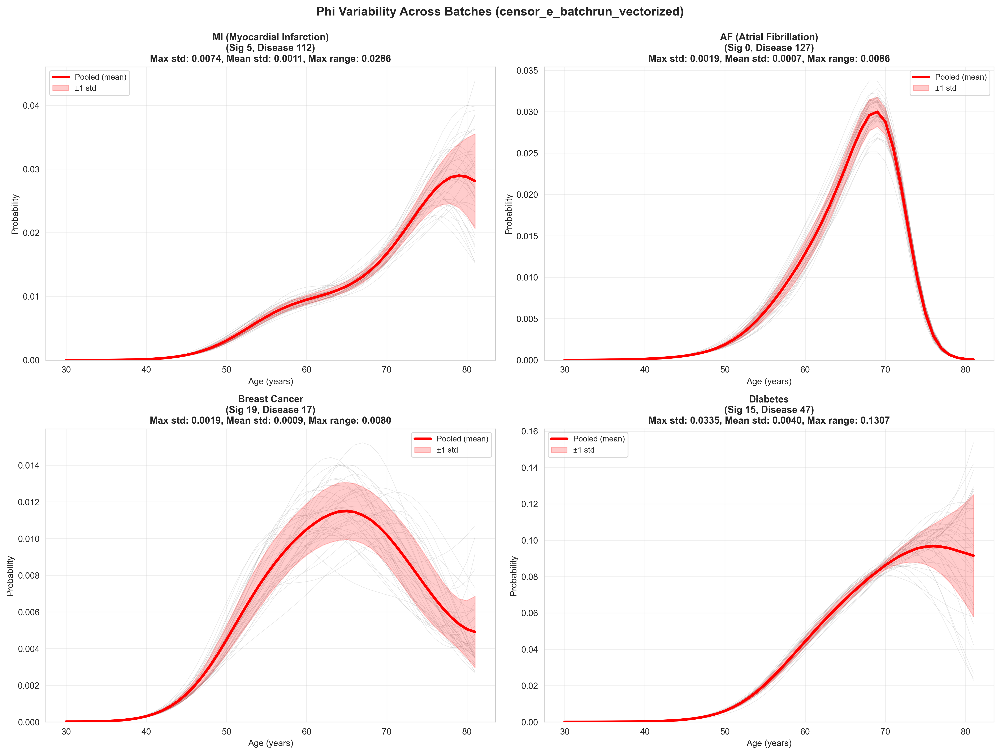


VARIABILITY SUMMARY

MI (Myocardial Infarction) (Disease 112, Signature 5):
  Mean std across time: 0.001052
  Max std across time: 0.007428
  Mean range across time: 0.004423
  Max range across time: 0.028559
  Coefficient of variation (mean/std/mean): 0.1130

AF (Atrial Fibrillation) (Disease 127, Signature 0):
  Mean std across time: 0.000656
  Max std across time: 0.001926
  Mean range across time: 0.002848
  Max range across time: 0.008574
  Coefficient of variation (mean/std/mean): 0.0862

Breast Cancer (Disease 17, Signature 19):
  Mean std across time: 0.000934
  Max std across time: 0.001948
  Mean range across time: 0.003986
  Max range across time: 0.008014
  Coefficient of variation (mean/std/mean): 0.1674

Diabetes (Disease 47, Signature 15):
  Mean std across time: 0.003979
  Max std across time: 0.033544
  Mean range across time: 0.016303
  Max range across time: 0.130677
  Coefficient of variation (mean/std/mean): 0.1041

POOLING ALL PHI VALUES
Pooled phi shape: (21, 3

In [80]:
import torch
import numpy as np
import glob
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.special import expit as sigmoid

# Diseases of interest: (disease_idx, signature, name)
diseases_of_interest = [
    (112, 5, "MI (Myocardial Infarction)"),
    (127, 0, "AF (Atrial Fibrillation)"),
    (17, 19, "Breast Cancer"),
    (47, 15, "Diabetes")
]

# Load all batch checkpoints
batch_pattern = '/Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_*_*.pt'
batch_files = sorted(glob.glob(batch_pattern))
print(f"Found {len(batch_files)} batch files")

# Extract phi for each disease across all batches
all_phi_by_disease = {d: [] for d in diseases_of_interest}
batch_info = []

for batch_file in batch_files:
    try:
        checkpoint = torch.load(batch_file, map_location='cpu', weights_only=False)
        phi = checkpoint['model_state_dict']['phi']
        if torch.is_tensor(phi):
            phi = phi.detach().cpu().numpy()
        
        # Extract batch info from filename
        batch_name = Path(batch_file).stem
        batch_info.append(batch_name)
        
        # Extract phi for each disease at its canonical signature
        for disease_idx, sig_idx, disease_name in diseases_of_interest:
            phi_value = phi[sig_idx, disease_idx, :]  # Shape: (T,)
            all_phi_by_disease[(disease_idx, sig_idx, disease_name)].append(phi_value)
            
    except Exception as e:
        print(f"Error loading {batch_file}: {e}")
        continue

print(f"\nLoaded phi from {len(batch_info)} batches")

# Convert to arrays and compute statistics
T = 52  # Assuming 52 timepoints (ages 30-81)
ages = np.arange(30, 30 + T)

# Plot variability and pooled results
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for plot_idx, (disease_idx, sig_idx, disease_name) in enumerate(diseases_of_interest):
    ax = axes[plot_idx]
    
    # Stack all batches for this disease
    phi_batches = np.array(all_phi_by_disease[(disease_idx, sig_idx, disease_name)])  # (n_batches, T)
    
    # Convert to probability
    phi_prob_batches = sigmoid(phi_batches)  # (n_batches, T)
    
    # Plot individual batches (light lines)
    for batch_idx in range(len(phi_prob_batches)):
        ax.plot(ages, phi_prob_batches[batch_idx, :], 
               color='gray', alpha=0.2, linewidth=0.5, zorder=1)
    
    # Compute pooled (mean) and std
    phi_prob_mean = np.mean(phi_prob_batches, axis=0)
    phi_prob_std = np.std(phi_prob_batches, axis=0)
    
    # Plot mean (pooled)
    ax.plot(ages, phi_prob_mean, 
           color='red', linewidth=3, label='Pooled (mean)', zorder=3)
    
    # Plot ±1 std band
    ax.fill_between(ages, 
                   phi_prob_mean - phi_prob_std,
                   phi_prob_mean + phi_prob_std,
                   color='red', alpha=0.2, label='±1 std', zorder=2)
    
    # Compute and display variability metrics
    max_std = np.max(phi_prob_std)
    mean_std = np.mean(phi_prob_std)
    max_range = np.max(np.max(phi_prob_batches, axis=0) - np.min(phi_prob_batches, axis=0))
    
    ax.set_title(f'{disease_name}\n(Sig {sig_idx}, Disease {disease_idx})\nMax std: {max_std:.4f}, Mean std: {mean_std:.4f}, Max range: {max_range:.4f}', 
                fontsize=11, fontweight='bold')
    ax.set_xlabel('Age (years)', fontsize=10)
    ax.set_ylabel('Probability', fontsize=10)
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.set_ylim(bottom=0)

plt.suptitle('Phi Variability Across Batches (censor_e_batchrun_vectorized)', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# Print summary statistics
print("\n" + "="*80)
print("VARIABILITY SUMMARY")
print("="*80)
for disease_idx, sig_idx, disease_name in diseases_of_interest:
    phi_batches = np.array(all_phi_by_disease[(disease_idx, sig_idx, disease_name)])
    phi_prob_batches = sigmoid(phi_batches)
    
    phi_prob_mean = np.mean(phi_prob_batches, axis=0)
    phi_prob_std = np.std(phi_prob_batches, axis=0)
    phi_prob_range = np.max(phi_prob_batches, axis=0) - np.min(phi_prob_batches, axis=0)
    
    print(f"\n{disease_name} (Disease {disease_idx}, Signature {sig_idx}):")
    print(f"  Mean std across time: {np.mean(phi_prob_std):.6f}")
    print(f"  Max std across time: {np.max(phi_prob_std):.6f}")
    print(f"  Mean range across time: {np.mean(phi_prob_range):.6f}")
    print(f"  Max range across time: {np.max(phi_prob_range):.6f}")
    print(f"  Coefficient of variation (mean/std/mean): {np.mean(phi_prob_std) / np.mean(phi_prob_mean):.4f}")

# Compute pooled phi (for all diseases, all signatures)
print("\n" + "="*80)
print("POOLING ALL PHI VALUES")
print("="*80)

all_phis = []
for batch_file in batch_files:
    try:
        checkpoint = torch.load(batch_file, map_location='cpu', weights_only=False)
        phi = checkpoint['model_state_dict']['phi']
        if torch.is_tensor(phi):
            phi = phi.detach().cpu().numpy()
        all_phis.append(phi)
    except:
        continue

phi_stack = np.stack(all_phis, axis=0)  # (n_batches, K, D, T)
phi_pooled = np.mean(phi_stack, axis=0)  # (K, D, T)

print(f"Pooled phi shape: {phi_pooled.shape}")
print(f"Pooled from {len(all_phis)} batches")

# Save pooled phi
torch.save(torch.tensor(phi_pooled), '/Users/sarahurbut/aladynoulli2/ukb_phi_pooled_censor_e.pt')
print("Saved pooled phi to: ukb_phi_pooled_censor_e.pt")

Found 40 batch files

Loaded phi from 40 batches


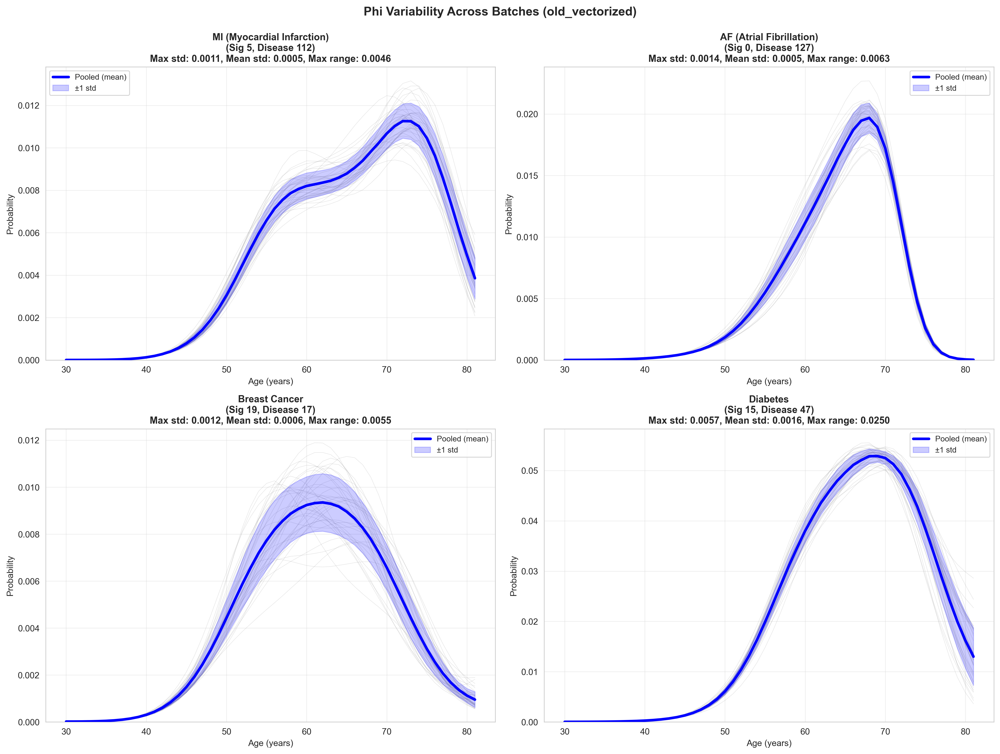


VARIABILITY SUMMARY

MI (Myocardial Infarction) (Disease 112, Signature 5):
  Mean std across time: 0.000463
  Max std across time: 0.001066
  Mean range across time: 0.002035
  Max range across time: 0.004557
  Coefficient of variation (mean/std/mean): 0.0910

AF (Atrial Fibrillation) (Disease 127, Signature 0):
  Mean std across time: 0.000497
  Max std across time: 0.001430
  Mean range across time: 0.002180
  Max range across time: 0.006316
  Coefficient of variation (mean/std/mean): 0.0915

Breast Cancer (Disease 17, Signature 19):
  Mean std across time: 0.000628
  Max std across time: 0.001246
  Mean range across time: 0.002704
  Max range across time: 0.005500
  Coefficient of variation (mean/std/mean): 0.1524

Diabetes (Disease 47, Signature 15):
  Mean std across time: 0.001566
  Max std across time: 0.005701
  Mean range across time: 0.006814
  Max range across time: 0.024970
  Coefficient of variation (mean/std/mean): 0.0741

POOLING ALL PHI VALUES
Pooled phi shape: (21, 3

In [ ]:
import torch
import numpy as np
import glob
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.special import expit as sigmoid

# Diseases of interest: (disease_idx, signature, name)
diseases_of_interest = [
    (112, 5, "MI (Myocardial Infarction)"),
    (127, 0, "AF (Atrial Fibrillation)"),
    (17, 19, "Breast Cancer"),
    (47, 15, "Diabetes")
]

# Load all batch checkpoints
batch_pattern = '/Users/sarahurbut/Library/CloudStorage/Dropbox/enrollment_retrospective_full/enrollment_model_W0.0001_batch_*_*.pt'
batch_files = sorted(glob.glob(batch_pattern))
print(f"Found {len(batch_files)} batch files")

# Extract phi for each disease across all batches
all_phi_by_disease = {d: [] for d in diseases_of_interest}
batch_info = []

for batch_file in batch_files:
    try:
        checkpoint = torch.load(batch_file, map_location='cpu', weights_only=False)
        phi = checkpoint['model_state_dict']['phi']
        if torch.is_tensor(phi):
            phi = phi.detach().cpu().numpy()
        
        # Extract batch info from filename
        batch_name = Path(batch_file).stem
        batch_info.append(batch_name)
        
        # Extract phi for each disease at its canonical signature
        for disease_idx, sig_idx, disease_name in diseases_of_interest:
            phi_value = phi[sig_idx, disease_idx, :]  # Shape: (T,)
            all_phi_by_disease[(disease_idx, sig_idx, disease_name)].append(phi_value)
            
    except Exception as e:
        print(f"Error loading {batch_file}: {e}")
        continue

print(f"\nLoaded phi from {len(batch_info)} batches")

# Convert to arrays and compute statistics
T = 52  # Assuming 52 timepoints (ages 30-81)
ages = np.arange(30, 30 + T)

# Plot variability and pooled results
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for plot_idx, (disease_idx, sig_idx, disease_name) in enumerate(diseases_of_interest):
    ax = axes[plot_idx]
    
    # Stack all batches for this disease
    phi_batches = np.array(all_phi_by_disease[(disease_idx, sig_idx, disease_name)])  # (n_batches, T)
    
    # Convert to probability
    phi_prob_batches = sigmoid(phi_batches)  # (n_batches, T)
    
    # Plot individual batches (light lines)
    for batch_idx in range(len(phi_prob_batches)):
        ax.plot(ages, phi_prob_batches[batch_idx, :], 
               color='gray', alpha=0.2, linewidth=0.5, zorder=1)
    
    # Compute pooled (mean) and std
    phi_prob_mean = np.mean(phi_prob_batches, axis=0)
    phi_prob_std = np.std(phi_prob_batches, axis=0)
    
    # Plot mean (pooled)
    ax.plot(ages, phi_prob_mean, 
           color='blue', linewidth=3, label='Pooled (mean)', zorder=3)
    
    # Plot ±1 std band
    ax.fill_between(ages, 
                   phi_prob_mean - phi_prob_std,
                   phi_prob_mean + phi_prob_std,
                   color='blue', alpha=0.2, label='±1 std', zorder=2)
    
    # Compute and display variability metrics
    max_std = np.max(phi_prob_std)
    mean_std = np.mean(phi_prob_std)
    max_range = np.max(np.max(phi_prob_batches, axis=0) - np.min(phi_prob_batches, axis=0))
    
    ax.set_title(f'{disease_name}\n(Sig {sig_idx}, Disease {disease_idx})\nMax std: {max_std:.4f}, Mean std: {mean_std:.4f}, Max range: {max_range:.4f}', 
                fontsize=11, fontweight='bold')
    ax.set_xlabel('Age (years)', fontsize=10)
    ax.set_ylabel('Probability', fontsize=10)
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.set_ylim(bottom=0)

plt.suptitle('Phi Variability Across Batches (old_vectorized)', 
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# Print summary statistics
print("\n" + "="*80)
print("VARIABILITY SUMMARY")
print("="*80)
for disease_idx, sig_idx, disease_name in diseases_of_interest:
    phi_batches = np.array(all_phi_by_disease[(disease_idx, sig_idx, disease_name)])
    phi_prob_batches = sigmoid(phi_batches)
    
    phi_prob_mean = np.mean(phi_prob_batches, axis=0)
    phi_prob_std = np.std(phi_prob_batches, axis=0)
    phi_prob_range = np.max(phi_prob_batches, axis=0) - np.min(phi_prob_batches, axis=0)
    
    print(f"\n{disease_name} (Disease {disease_idx}, Signature {sig_idx}):")
    print(f"  Mean std across time: {np.mean(phi_prob_std):.6f}")
    print(f"  Max std across time: {np.max(phi_prob_std):.6f}")
    print(f"  Mean range across time: {np.mean(phi_prob_range):.6f}")
    print(f"  Max range across time: {np.max(phi_prob_range):.6f}")
    print(f"  Coefficient of variation (mean/std/mean): {np.mean(phi_prob_std) / np.mean(phi_prob_mean):.4f}")

# Compute pooled phi (for all diseases, all signatures)
print("\n" + "="*80)
print("POOLING ALL PHI VALUES")
print("="*80)

all_phis = []
for batch_file in batch_files:
    try:
        checkpoint = torch.load(batch_file, map_location='cpu', weights_only=False)
        phi = checkpoint['model_state_dict']['phi']
        if torch.is_tensor(phi):
            phi = phi.detach().cpu().numpy()
        all_phis.append(phi)
    except:
        continue

phi_stack = np.stack(all_phis, axis=0)  # (n_batches, K, D, T)
phi_pooled = np.mean(phi_stack, axis=0)  # (K, D, T)

print(f"Pooled phi shape: {phi_pooled.shape}")
print(f"Pooled from {len(all_phis)} batches")

# Save pooled phi
torch.save(torch.tensor(phi_pooled), '/Users/sarahurbut/aladynoulli2/ukb_phi_pooled_old_censor.pt')
print("Saved pooled phi to: ukb_phi_pooled_old_censor.pt")

In [90]:
tl=torch.load('/Users/sarahurbut/Dropbox-Personal/data_for_running/master_for_fitting_pooled_all_data.pt')
tl.keys()
print(tl['model_state_dict']['phi'].shape)
print(tl['model_state_dict']['psi'].shape)




torch.Size([21, 348, 52])
torch.Size([21, 348])


In [93]:
import sys
sys.path.append('/Users/sarahurbut/aladynoulli2/claudefile')
from create_master_checkpoints import *
initial_psi=torch.load('/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/initial_psi_400k.pt')


# Import functions from create_master_checkpoints
import sys
sys.path.append('/Users/sarahurbut/aladynoulli2/claudefile/')
from create_master_checkpoints import pool_phi_from_batches, create_master_checkpoint

# Load initial_psi
data_dir = '/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/'
initial_psi = torch.load(data_dir + 'initial_psi_400k.pt', weights_only=False)
if torch.is_tensor(initial_psi):
    initial_psi = initial_psi.cpu().numpy()
print(f"Loaded initial_psi, shape: {initial_psi.shape}")

# Create pooled phi for retrospective data and compare with notebook results
print("\n" + "="*80)
print("Creating pooled phi for retrospective data")
print("="*80)
retrospective_pattern = '/Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_*_*.pt'
phi_retrospective_pooled = pool_phi_from_batches(retrospective_pattern)

# Create master checkpoint files
print("\n" + "="*80)
print("Creating master checkpoint files")
print("="*80)
output_dir = data_dir

# Master checkpoint for retrospective (all data)
output_path_retro = output_dir + 'master_for_fitting_pooled_correctedE.pt'
create_master_checkpoint(
    phi_retrospective_pooled,
    initial_psi,
    output_path_retro,
    description="Pooled phi from all retrospective batches + initial_psi"
)


phi_notebook_mean = phi_stack.mean(axis=0)

print(f"  Are they equal? {np.allclose(phi_retrospective_pooled, phi_notebook_mean)}")




Loaded initial_psi, shape: (20, 348)

Creating pooled phi for retrospective data
Found 40 files matching pattern: /Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_*_*.pt
Loaded phi from enrollment_model_W0.0001_batch_0_10000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_100000_110000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_10000_20000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_110000_120000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_120000_130000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_130000_140000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_140000_150000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_150000_160000.pt, shape: (21, 348, 52)
Loaded phi from enrollment_model_W0.0001_batch_160000_170000.pt, shape: (21, 348, 52)
Loaded

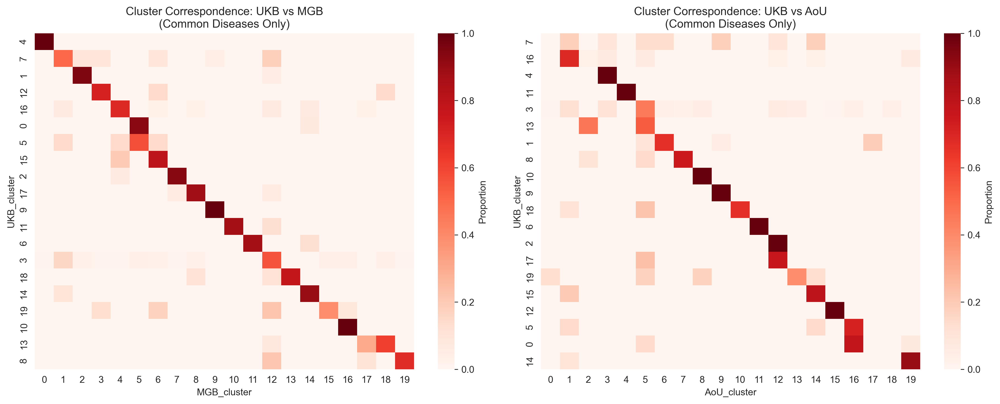

In [96]:
# Alternative: Use plot_disease_blocks for cross-cohort validation visualization
# This shows cluster correspondence between UKB, MGB, and AoU
# Useful for demonstrating signature stability across cohorts

# Uncomment to use:
sys.path.append('/Users/sarahurbut/aladynoulli2/pyScripts')
from utils import plot_disease_blocks

mgb_checkpoint = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam_MGB.pt')
aou_checkpoint = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam_AOU.pt')

results = plot_disease_blocks(
    mgb_checkpoint, 
    aou_checkpoint, 
    ukb_checkpoint,
    output_path=None
)


In [107]:
mgb_new_checkpoint=torch.load('/Users/sarahurbut/aladynoulli2/mgb_model_initialized.pt')
aou_new_checkpoint=torch.load('/Users/sarahurbut/aladynoulli2/aou_model_initialized.pt')


In [104]:

results['best_matches_mgb']

,UKB,MGB
UKB_cluster,,
4,4,0
7,7,1
1,1,2
12,12,3
16,16,4
0,0,5
5,5,5
15,15,6
2,2,7


## Calculate Empirical Hazards from MGB/AOU ICD10 Data

Calculate empirical hazards from raw ICD10 data to compare with model's learned phi values.
This addresses the competing risk concern by showing the model captures empirical patterns.


## Plot Signature Patterns for All Three Cohorts (UKB, AOU, MGB)

Create signature plots showing phi values for all signatures (0-14) for each cohort.
Each plot shows diseases in the signature (colored) vs background diseases (grey).


In [1]:
# Define plotting functions
from scipy.special import expit as sigmoid
import sys
sys.path.append('/Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/main_paper_figures')
from plot_signature_patterns import plot_signature_phi_patterns

print("Plotting functions loaded!")

Plotting functions loaded!


In [2]:
# Load all three trained models
import sys
sys.path.append('/Users/sarahurbut/aladynoulli2/pyScripts')
import torch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


print("Loading model checkpoints...")

# UKB: master checkpoint with pooled phi
ukb_master = torch.load('/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/master_for_fitting_pooled_correctedE.pt', map_location='cpu')
ukb_phi = ukb_master['model_state_dict']['phi']
if torch.is_tensor(ukb_phi):
    ukb_phi = ukb_phi.detach().cpu().numpy()

# AOU: trained model
aou_checkpoint = torch.load('/Users/sarahurbut/aladynoulli2/aou_model_initialized.pt', map_location='cpu')
aou_phi = aou_checkpoint['model_state_dict']['phi']
if torch.is_tensor(aou_phi):
    aou_phi = aou_phi.detach().cpu().numpy()

# MGB: trained model
mgb_checkpoint = torch.load('/Users/sarahurbut/aladynoulli2/mgb_model_initialized.pt', map_location='cpu')
mgb_phi = mgb_checkpoint['model_state_dict']['phi']
if torch.is_tensor(mgb_phi):
    mgb_phi = mgb_phi.detach().cpu().numpy()

# Load clusters and disease names for each cohort
# UKB
ukb_checkpoint_ref = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam.pt', map_location='cpu')
ukb_clusters = ukb_checkpoint_ref['clusters']
if torch.is_tensor(ukb_clusters):
    ukb_clusters = ukb_clusters.detach().cpu().numpy()
ukb_disease_names = ukb_checkpoint_ref['disease_names']
if isinstance(ukb_disease_names, (list, tuple)):
    ukb_disease_names = list(ukb_disease_names)
elif hasattr(ukb_disease_names, 'values'):
    ukb_disease_names = ukb_disease_names.values.tolist()

# AOU
aou_clusters = aou_checkpoint['clusters']
if torch.is_tensor(aou_clusters):
    aou_clusters = aou_clusters.detach().cpu().numpy()
aou_disease_names = aou_checkpoint.get('disease_names', None)
if aou_disease_names is None:
    # Try to load from old checkpoint
    aou_old = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam_aou_psi12.pt', map_location='cpu')
    aou_disease_names = aou_old.get('disease_names', [f"Disease_{i}" for i in range(aou_phi.shape[1])])
if isinstance(aou_disease_names, (list, tuple)):
    aou_disease_names = list(aou_disease_names)
elif hasattr(aou_disease_names, 'values'):
    aou_disease_names = aou_disease_names.values.tolist()

# MGB
mgb_clusters = mgb_checkpoint['clusters']
if torch.is_tensor(mgb_clusters):
    mgb_clusters = mgb_clusters.detach().cpu().numpy()
mgb_disease_names = mgb_checkpoint.get('disease_names', None)
if mgb_disease_names is None:
    # Try to load from old checkpoint
    mgb_old = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam_MGB.pt', map_location='cpu')
    mgb_disease_names = mgb_old.get('disease_names', [f"Disease_{i}" for i in range(mgb_phi.shape[1])])
if isinstance(mgb_disease_names, (list, tuple)):
    mgb_disease_names = list(mgb_disease_names)
elif hasattr(mgb_disease_names, 'values'):
    mgb_disease_names = mgb_disease_names.values.tolist()

print(f"UKB: phi shape {ukb_phi.shape}, clusters shape {ukb_clusters.shape}, {len(ukb_disease_names)} diseases")
print(f"AOU: phi shape {aou_phi.shape}, clusters shape {aou_clusters.shape}, {len(aou_disease_names)} diseases")
print(f"MGB: phi shape {mgb_phi.shape}, clusters shape {mgb_clusters.shape}, {len(mgb_disease_names)} diseases")

# Determine number of signatures (should be 15 for all)
n_sigs = min(ukb_phi.shape[0], aou_phi.shape[0], mgb_phi.shape[0])
selected_sigs = list(range(n_sigs))
print(f"\nPlotting {n_sigs} signatures for each cohort")


Loading model checkpoints...
UKB: phi shape (21, 348, 52), clusters shape (348,), 348 diseases
AOU: phi shape (21, 348, 51), clusters shape (348,), 348 diseases
MGB: phi shape (21, 346, 51), clusters shape (346,), 346 diseases

Plotting 21 signatures for each cohort


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_19298/3131534044.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ukb_master = torch.load('/Users/sarahurbut/L


UKB Signature Patterns


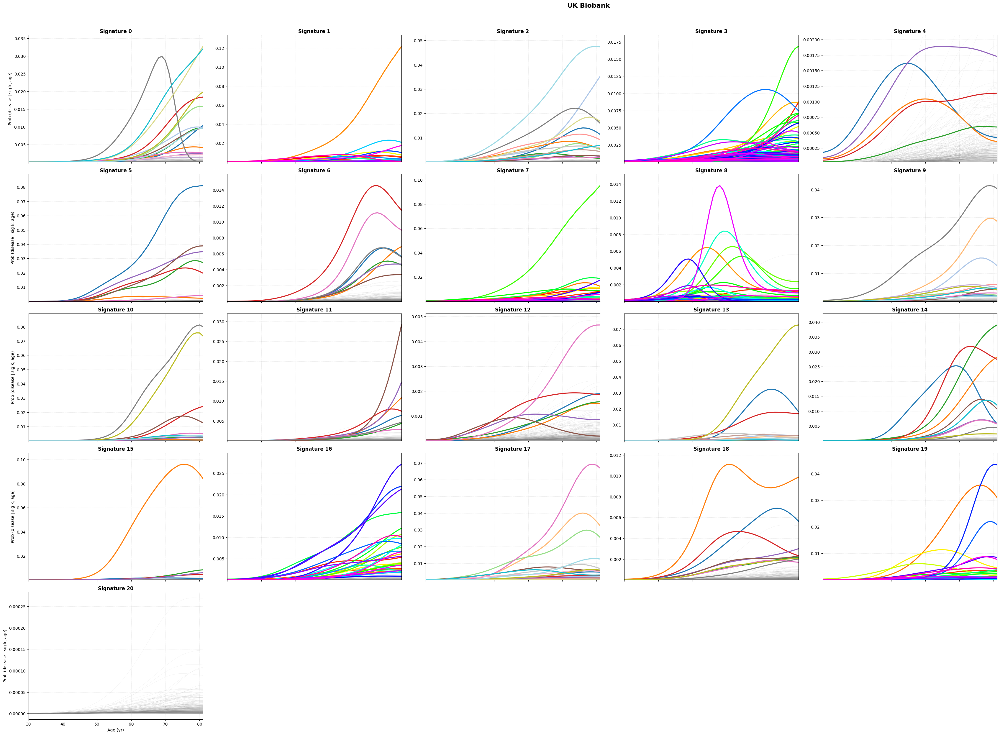


AOU Signature Patterns


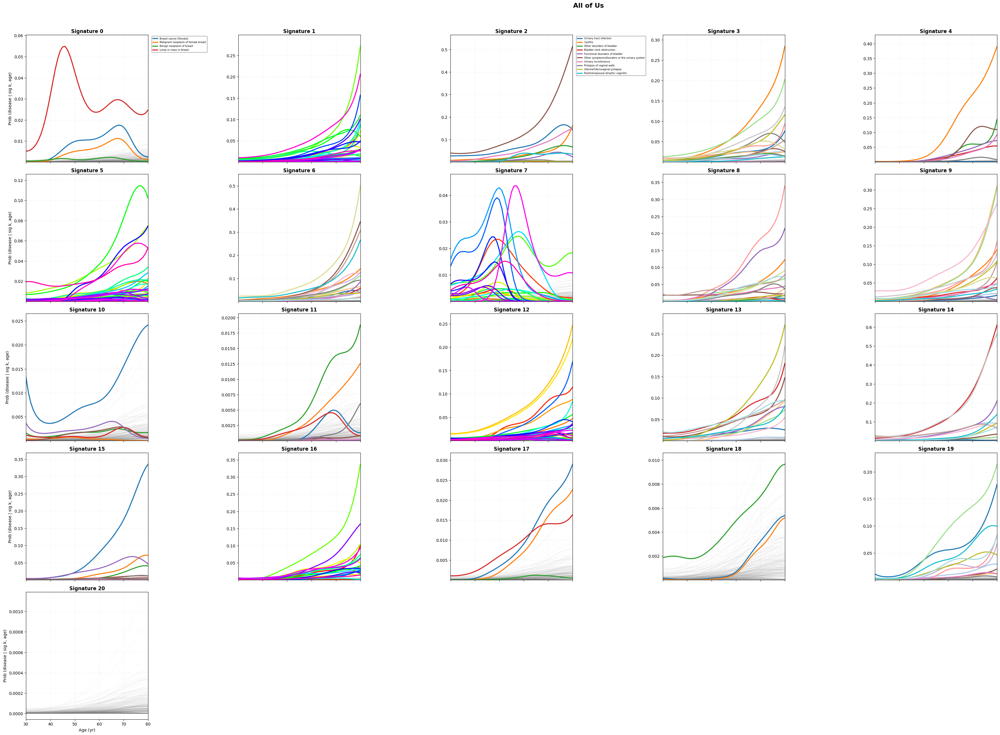


MGB Signature Patterns


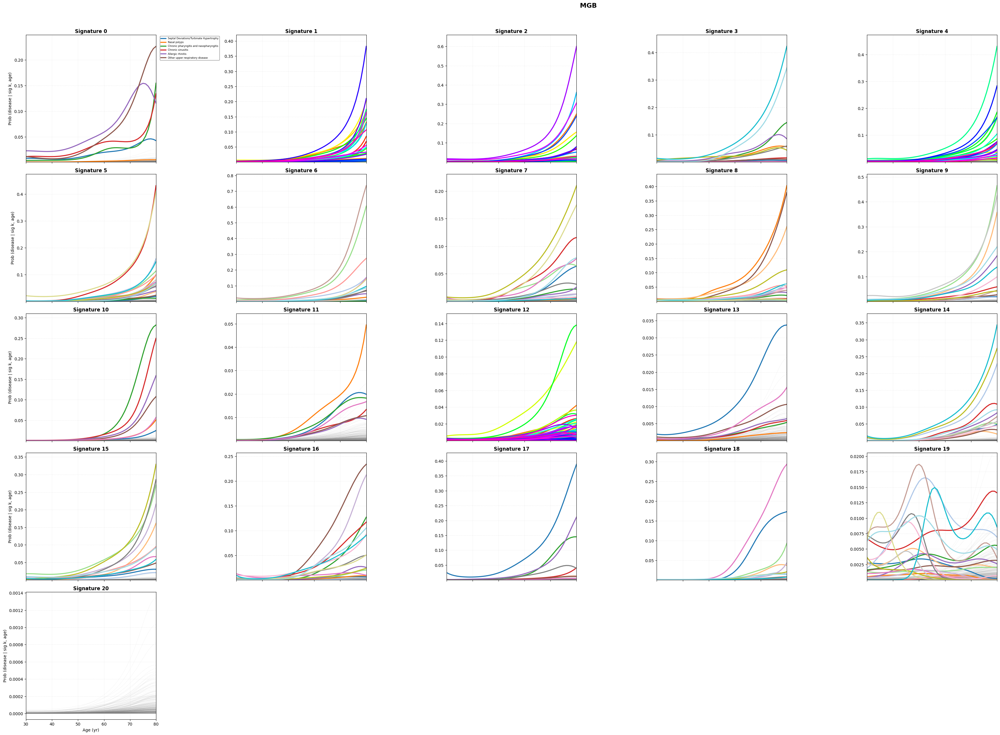


✓ All signature plots generated!


In [5]:
# Reload the module to get the updated function
import importlib
import sys
sys.path.append('/Users/sarahurbut/aladynoulli2/pyScripts/dec_6_revision/new_notebooks/main_paper_figures')
from plot_signature_patterns_fixed import *

# Plot UKB signatures
print("\n" + "="*80)
print("UKB Signature Patterns")
print("="*80)
fig_ukb = plot_signature_phi_patterns(
    ukb_phi, ukb_clusters, ukb_disease_names,
    selected_signatures=selected_sigs,
    top_n_diseases=None,  # Show all diseases in each signature
    plot_probability=True,  # Convert to probability
    age_offset=30
)
plt.suptitle('UK Biobank', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0, 0, 0.85, 0.98])
plt.show()

# Plot AOU signatures
print("\n" + "="*80)
print("AOU Signature Patterns")
print("="*80)
fig_aou = plot_signature_phi_patterns(
    aou_phi, aou_clusters, aou_disease_names,
    selected_signatures=selected_sigs,
    top_n_diseases=None,  # Show all diseases in each signature
    plot_probability=True,  # Convert to probability
    age_offset=30
)
plt.suptitle('All of Us', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0, 0, 0.85, 0.98])
plt.show()

# Plot MGB signatures
print("\n" + "="*80)
print("MGB Signature Patterns")
print("="*80)
fig_mgb = plot_signature_phi_patterns(
    mgb_phi, mgb_clusters, mgb_disease_names,
    selected_signatures=selected_sigs,
    top_n_diseases=None,  # Show all diseases in each signature
    plot_probability=True,  # Convert to probability
    age_offset=30
)
plt.suptitle('MGB', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0, 0, 0.85, 0.98])
plt.show()

print("\n✓ All signature plots generated!")


## Panel B & C: PSI Heatmap and Disease Prevalence by Age (Corrected E)

Create two plots:
1. **Panel B:** PSI heatmap showing disease-signature associations (log odds ratios)
2. **Panel C:** Disease prevalence by age, clustered by signature (average pi over people)

These plots demonstrate that we no longer have censoring bias with the corrected E approach.


In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.special import expit as sigmoid
import glob
from pathlib import Path

# Load PSI from one batch (or average from 40 batches)
batch_pattern = '/Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_*_*.pt'
batch_files = sorted(glob.glob(batch_pattern))

print(f"Found {len(batch_files)} batch files")

# Option 1: Use first batch
if len(batch_files) > 0:
    batch_checkpoint = torch.load(batch_files[0], map_location='cpu', weights_only=False)
    psi = batch_checkpoint['model_state_dict']['psi']
    if torch.is_tensor(psi):
        psi = psi.detach().cpu().numpy()
    print(f"Loaded PSI from first batch: {batch_files[0]}")
    print(f"PSI shape: {psi.shape}")
    
    # Option 2: Average across all batches (uncomment to use)
    # all_psis = []
    # for batch_file in batch_files:
    #     try:
    #         checkpoint = torch.load(batch_file, map_location='cpu', weights_only=False)
    #         psi_batch = checkpoint['model_state_dict']['psi']
    #         if torch.is_tensor(psi_batch):
    #             psi_batch = psi_batch.detach().cpu().numpy()
    #         all_psis.append(psi_batch)
    #     except:
    #         continue
    # psi = np.mean(np.stack(all_psis, axis=0), axis=0)
    # print(f"Averaged PSI across {len(all_psis)} batches")
else:
    raise FileNotFoundError("No batch files found!")

# Load clusters and disease names
ukb_checkpoint_ref = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam.pt', map_location='cpu')
clusters = ukb_checkpoint_ref['clusters']
if torch.is_tensor(clusters):
    clusters = clusters.detach().cpu().numpy()
disease_names = ukb_checkpoint_ref['disease_names']
if isinstance(disease_names, (list, tuple)):
    disease_names = list(disease_names)
elif hasattr(disease_names, 'values'):
    disease_names = disease_names.values.tolist()

print(f"Clusters shape: {clusters.shape}")
print(f"Number of diseases: {len(disease_names)}")
print(f"Number of signatures: {psi.shape[0]}")


Found 40 batch files
Loaded PSI from first batch: /Users/sarahurbut/Library/CloudStorage/Dropbox/censor_e_batchrun_vectorized/enrollment_model_W0.0001_batch_0_10000.pt
PSI shape: (21, 348)
Clusters shape: (348,)
Number of diseases: 348
Number of signatures: 21


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_34049/2707410204.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ukb_checkpoint_ref = torch.load('/Users/sara

In [12]:
# Load pi tensor and average over people
pi_path = '/Users/sarahurbut/Library/CloudStorage/Dropbox/enrollment_predictions_fixedphi_correctedE_vectorized/pi_enroll_fixedphi_sex_FULL.pt'
print(f"Loading pi tensor from: {pi_path}")

pi_full = torch.load(pi_path, map_location='cpu', weights_only=False)
if torch.is_tensor(pi_full):
    pi_full = pi_full.detach().cpu().numpy()

print(f"Pi tensor shape: {pi_full.shape}")  # Should be (N, D, T)

# Average over people (patients) to get (D, T) - average probability for each disease at each age
pi_avg = np.mean(pi_full, axis=0)  # Shape: (D, T)
print(f"Average pi shape: {pi_avg.shape}")  # Should be (D, T)

# Get age points (assuming age_offset=30, T=52 timepoints)
T = pi_avg.shape[1]
age_points = np.arange(30, 30 + T)
print(f"Age range: {age_points[0]}-{age_points[-1]}")


Loading pi tensor from: /Users/sarahurbut/Library/CloudStorage/Dropbox/enrollment_predictions_fixedphi_correctedE_vectorized/pi_enroll_fixedphi_sex_FULL.pt
Pi tensor shape: (400000, 348, 52)
Average pi shape: (348, 52)
Age range: 30-81


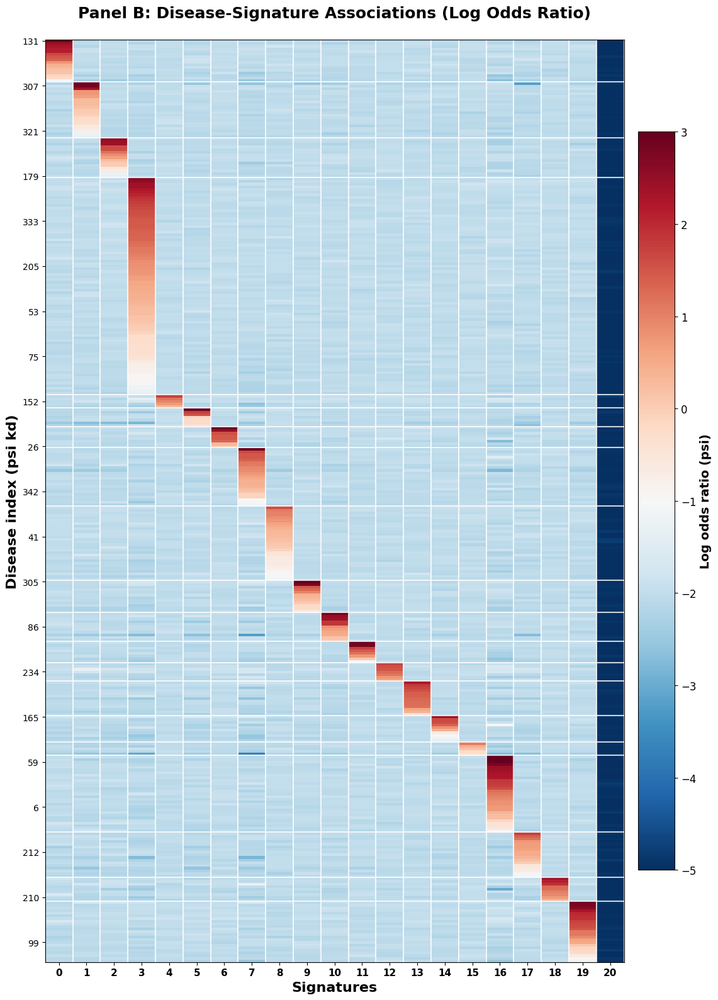

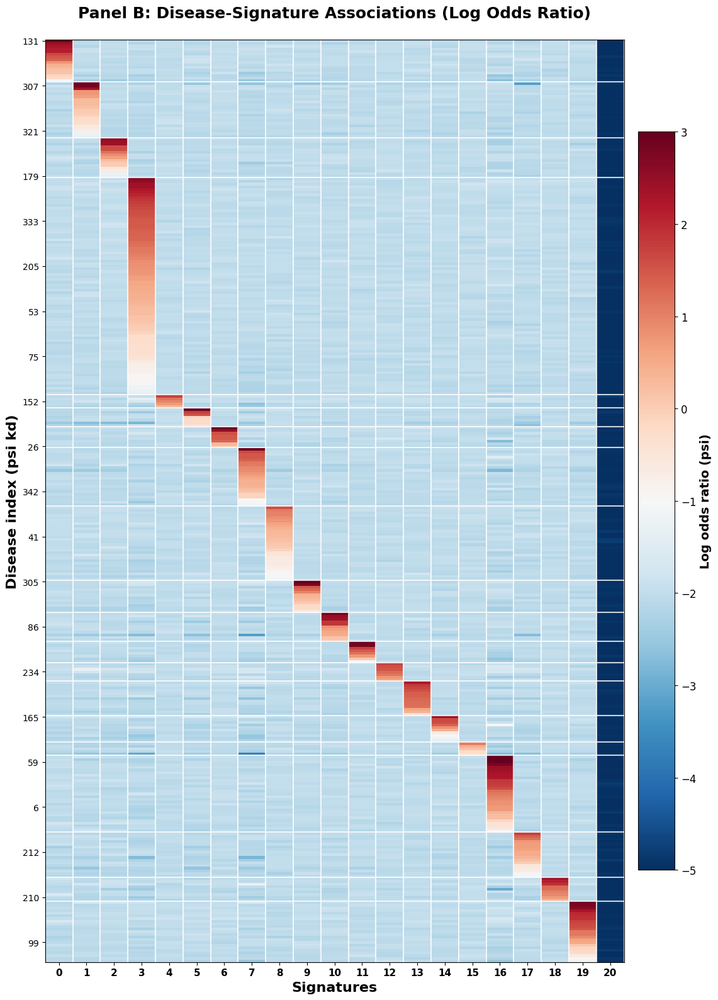

✓ Panel B: PSI heatmap created


In [35]:
# Create Panel B: PSI Heatmap (Disease Index vs Signatures)
# PSI shape: (K, D) where K=21 signatures, D=348 diseases
# We want to show: diseases (rows) vs signatures (columns)

# Transpose PSI to get (D, K) for heatmap
psi_heatmap = psi.T  # Shape: (D, K)

# Create figure for PSI heatmap only
fig1, ax1 = plt.subplots(1, 1, figsize=(12, 16))

# Create heatmap
# Note: We'll show a subset of diseases (top diseases per signature) for clarity
# Or show all diseases but cluster them by signature

# Reorder diseases by signature (cluster assignment), then by max psi within each signature
# Group diseases by signature
sig_to_diseases = {}
for d in range(len(clusters)):
    sig = clusters[d]
    if sig not in sig_to_diseases:
        sig_to_diseases[sig] = []
    sig_to_diseases[sig].append(d)

# Sort diseases within each signature by their maximum psi value (most positive first)
disease_order = []
for sig in sorted(sig_to_diseases.keys()):
    diseases_in_sig = sig_to_diseases[sig]
    # Get max psi value for each disease in this signature (across all signatures)
    # We want the psi value for this disease in its own signature
    max_psi_values = [psi[sig, d] for d in diseases_in_sig]
    # Sort by max psi (descending - most positive first)
    sorted_indices = sorted(range(len(diseases_in_sig)), 
                           key=lambda i: max_psi_values[i], reverse=True)
    disease_order.extend([diseases_in_sig[i] for i in sorted_indices])

# Reorder PSI and disease names
psi_ordered = psi_heatmap[disease_order, :]
disease_names_ordered = [disease_names[i] for i in disease_order]

# Create heatmap with improved aesthetics
im = ax1.imshow(psi_ordered, aspect='auto', cmap='RdBu_r', 
                vmin=-5, vmax=3, interpolation='nearest')

# Set labels with better formatting
ax1.set_xlabel('Signatures', fontsize=16, fontweight='bold')
ax1.set_ylabel('Disease index (psi kd)', fontsize=16, fontweight='bold')
ax1.set_title('Panel B: Disease-Signature Associations (Log Odds Ratio)', 
              fontsize=18, fontweight='bold', pad=25)

# Set x-axis ticks (signatures 0-20)
ax1.set_xticks(np.arange(psi.shape[0]))
ax1.set_xticklabels([f'{i}' for i in range(psi.shape[0])], fontsize=11, fontweight='bold')

# Set y-axis ticks (show fewer labels for readability)
n_diseases = len(disease_order)
y_tick_interval = max(1, n_diseases // 20)  # Show ~20 labels
ax1.set_yticks(np.arange(0, n_diseases, y_tick_interval))
ax1.set_yticklabels([f'{disease_order[i]}' for i in range(0, n_diseases, y_tick_interval)], 
                    fontsize=10)

# Add colorbar with better formatting
cbar = fig1.colorbar(im, ax=ax1, label='Log odds ratio (psi)', pad=0.02, shrink=0.8)
cbar.ax.tick_params(labelsize=12)
cbar.set_label('Log odds ratio (psi)', fontsize=14, fontweight='bold')

# Add vertical lines to separate signatures
for k in range(psi.shape[0] + 1):
    ax1.axvline(k - 0.5, color='white', linewidth=1.5, alpha=0.8)

# Add horizontal lines to separate signature groups (diseases grouped by signature)
current_y = 0
for sig in sorted(sig_to_diseases.keys()):
    n_diseases_in_sig = len(sig_to_diseases[sig])
    if current_y > 0:
        ax1.axhline(current_y - 0.5, color='white', linewidth=1.5, alpha=0.8)
    current_y += n_diseases_in_sig

plt.tight_layout()

# Display the figure
from IPython.display import display
display(fig1)
plt.show()

print("✓ Panel B: PSI heatmap created")


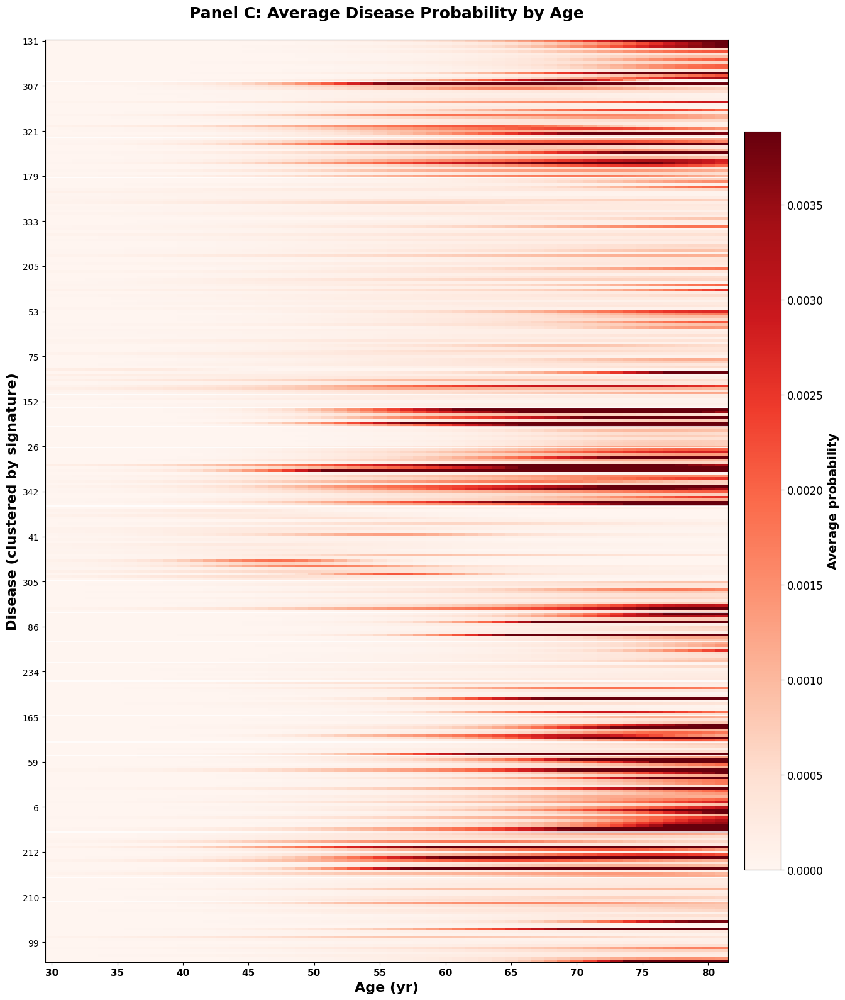

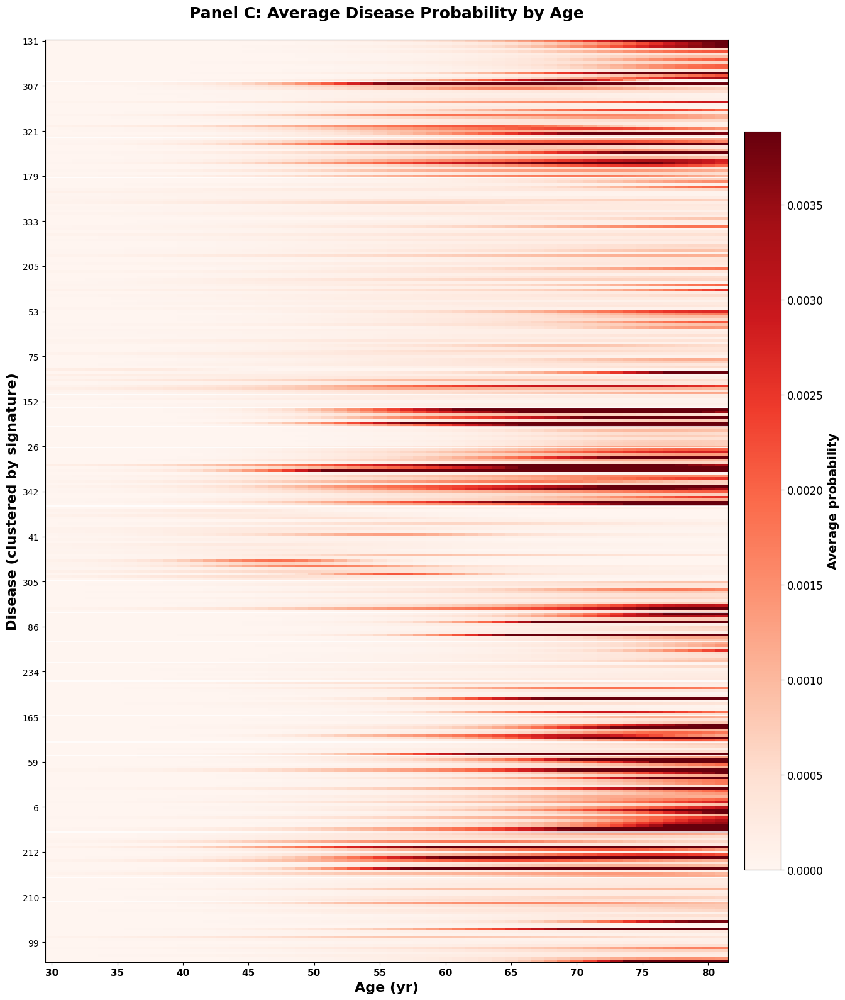

✓ Panel C: Disease prevalence heatmap created

Summary:
  Panel B: PSI heatmap - 21 signatures × 348 diseases
  Panel C: Disease prevalence - 348 diseases × 52 ages
  Diseases sorted by strongest psi within each signature (strongest at top)


In [34]:
# Panel C: Disease Prevalence by Age (clustered by signature)
# Show average probability (pi averaged over people) for each disease across ages
# Diseases should be clustered/grouped by their signature assignment

# Create separate figure for PI heatmap
fig2, ax2 = plt.subplots(1, 1, figsize=(14, 16))

# Reorder diseases by signature, then by max psi within signature (same as Panel B)
# Group diseases by signature
sig_to_diseases = {}
for d in range(len(clusters)):
    sig = clusters[d]
    if sig not in sig_to_diseases:
        sig_to_diseases[sig] = []
    sig_to_diseases[sig].append(d)

# Sort diseases within each signature by their maximum psi value (most positive first)
disease_order_by_sig = []
for sig in sorted(sig_to_diseases.keys()):
    diseases_in_sig = sig_to_diseases[sig]
    # Get max psi value for each disease in this signature
    max_psi_values = [psi[sig, d] for d in diseases_in_sig]
    # Sort by max psi (descending - most positive first)
    sorted_indices = sorted(range(len(diseases_in_sig)), 
                           key=lambda i: max_psi_values[i], reverse=True)
    disease_order_by_sig.extend([diseases_in_sig[i] for i in sorted_indices])

# Reorder pi_avg
pi_avg_ordered = pi_avg[disease_order_by_sig, :]  # Shape: (D, T)

# Set vmax based on actual data (use 95th percentile to avoid outliers, or max)
pi_max = np.max(pi_avg_ordered)
pi_95th = np.percentile(pi_avg_ordered, 95)
vmax_pi = min(pi_max * 1.1, pi_95th * 1.5)  # Use 95th percentile with some padding, or max

# Create heatmap with improved aesthetics
im2 = ax2.imshow(pi_avg_ordered, aspect='auto', cmap='Reds', 
                 vmin=0, vmax=vmax_pi, interpolation='nearest')

# Set labels with better formatting
ax2.set_xlabel('Age (yr)', fontsize=16, fontweight='bold')
ax2.set_ylabel('Disease (clustered by signature)', fontsize=16, fontweight='bold')
ax2.set_title('Panel C: Average Disease Probability by Age', 
              fontsize=18, fontweight='bold', pad=25)

# Set x-axis ticks (ages)
age_tick_interval = max(1, T // 10)
age_tick_indices = np.arange(0, T, age_tick_interval)
ax2.set_xticks(age_tick_indices)
ax2.set_xticklabels([f'{age_points[i]:.0f}' for i in age_tick_indices], fontsize=11, fontweight='bold')

# Set y-axis ticks (show disease indices only for readability)
n_diseases_show = len(disease_order_by_sig)
y_tick_interval = max(1, n_diseases_show // 20)  # Show ~20 labels
y_tick_indices = np.arange(0, n_diseases_show, y_tick_interval)
# Just show disease indices (not names) for readability
ax2.set_yticks(y_tick_indices)
ax2.set_yticklabels([f'{disease_order_by_sig[i]}' for i in y_tick_indices], fontsize=10)

# Add colorbar with better formatting
cbar2 = fig2.colorbar(im2, ax=ax2, label='Average probability', pad=0.02, shrink=0.8)
cbar2.ax.tick_params(labelsize=12)
cbar2.set_label('Average probability', fontsize=14, fontweight='bold')

# Add horizontal lines to separate signature groups
current_y = 0
for sig in sorted(sig_to_diseases.keys()):
    n_diseases_in_sig = len(sig_to_diseases[sig])
    if current_y > 0:
        ax2.axhline(current_y - 0.5, color='white', linewidth=1.5, alpha=0.8)
    current_y += n_diseases_in_sig

plt.tight_layout()

# Display the figure
from IPython.display import display
display(fig2)
plt.show()

print("✓ Panel C: Disease prevalence heatmap created")
print(f"\nSummary:")
print(f"  Panel B: PSI heatmap - {psi.shape[0]} signatures × {psi.shape[1]} diseases")
print(f"  Panel C: Disease prevalence - {pi_avg.shape[0]} diseases × {pi_avg.shape[1]} ages")
print(f"  Diseases sorted by strongest psi within each signature (strongest at top)")


## Censor Time Heatmap: E Matrix Patterns by Max Censor Age

Create a heatmap showing how E (event/censoring matrix) patterns vary by censor time.
This visualizes the censoring structure and shows how follow-up duration affects event patterns.


In [37]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load E matrix and censor info
print("Loading E matrix and censor information...")
E_full = torch.load('/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/E_enrollment_full.pt', 
                    map_location='cpu', weights_only=False)
if torch.is_tensor(E_full):
    E_full = E_full.detach().cpu().numpy()

censor_df = pd.read_csv('/Users/sarahurbut/Library/CloudStorage/Dropbox-Personal/data_for_running/censor_info.csv')

print(f"E shape: {E_full.shape}")
print(f"Censor info shape: {len(censor_df)} patients")
print(f"Censor age range: {censor_df['max_censor'].min():.1f} - {censor_df['max_censor'].max():.1f}")

# Cap at 400K for consistency
MAX_PATIENTS = 400000
E_full = E_full[:MAX_PATIENTS]
censor_df = censor_df.iloc[:MAX_PATIENTS].reset_index(drop=True)

print(f"After capping: E shape: {E_full.shape}, Censor info: {len(censor_df)} patients")


Loading E matrix and censor information...
E shape: (407878, 348)
Censor info shape: 407878 patients
Censor age range: 51.0 - 81.0
After capping: E shape: (400000, 348), Censor info: 400000 patients


In [ ]:
# Create bins for censor times (group into age bins)
censor_ages = censor_df['max_censor'].values
age_bins = np.arange(40, 85, 5)  # 5-year bins: 40-45, 45-50, ..., 80-85
age_bin_labels = [f'{int(age_bins[i])}-{int(age_bins[i+1])}' for i in range(len(age_bins)-1)]
age_bin_labels.append(f'{int(age_bins[-1])}+')  # Last bin for 80+

# Assign each patient to an age bin
censor_bins = np.digitize(censor_ages, age_bins)
censor_bins = np.clip(censor_bins, 0, len(age_bin_labels) - 1)

print(f"Age bins: {age_bin_labels}")
print(f"Patients per bin:")
for i, label in enumerate(age_bin_labels):
    n_in_bin = np.sum(censor_bins == i)
    print(f"  {label}: {n_in_bin:,} patients ({n_in_bin/len(censor_bins)*100:.1f}%)")

# Compute average E values by censor time bin and disease
# E shape: (N, D) - event times for each patient and disease
N, D = E_full.shape

# Get max time (T) from E values - typically T-1 is the censoring indicator
T = int(np.max(E_full)) + 1  # Add 1 because E is 0-indexed
print(f"E shape: (N={N}, D={D}), Max E value: {np.max(E_full)}, T={T}")

# Create heatmap data: average E value (event time) by censor bin and disease
# This shows the actual event/censoring times, which is more informative
heatmap_data = np.zeros((len(age_bin_labels), D))
patient_counts = np.zeros(len(age_bin_labels))

for bin_idx in range(len(age_bin_labels)):
    bin_mask = (censor_bins == bin_idx)
    n_patients_in_bin = np.sum(bin_mask)
    patient_counts[bin_idx] = n_patients_in_bin
    
    if n_patients_in_bin > 0:
        # Get E for patients in this bin
        E_bin = E_full[bin_mask, :]  # Shape: (n_bin, D)
        
        # Compute average E value (event/censor time) for each disease
        # This shows when events typically occur (or when censoring happens)
        avg_E = np.mean(E_bin, axis=0)  # Shape: (D,)
        heatmap_data[bin_idx, :] = avg_E

print(f"\nHeatmap data shape: {heatmap_data.shape}")
print(f"Average E value range: {np.min(heatmap_data):.2f} - {np.max(heatmap_data):.2f}")
print(f"Mean average E: {np.mean(heatmap_data):.2f}")
print(f"\nNote: E values represent event/censor times (0 to {T-1})")
print(f"Lower values = earlier events, Higher values = later events or censoring")


Age bins: ['40-45', '45-50', '50-55', '55-60', '60-65', '65-70', '70-75', '75-80', '80+']
Patients per bin:
  40-45: 0 patients (0.0%)
  45-50: 0 patients (0.0%)
  50-55: 0 patients (0.0%)
  55-60: 2,619 patients (0.7%)
  60-65: 35,396 patients (8.8%)
  65-70: 47,720 patients (11.9%)
  70-75: 58,353 patients (14.6%)
  75-80: 76,009 patients (19.0%)
  80+: 179,903 patients (45.0%)
E shape: (N=400000, D=348), Max E value: 43, T=44

Heatmap data shape: (9, 348)
Event rate range: 0.0000 - 1.0000
Mean event rate: 0.6667


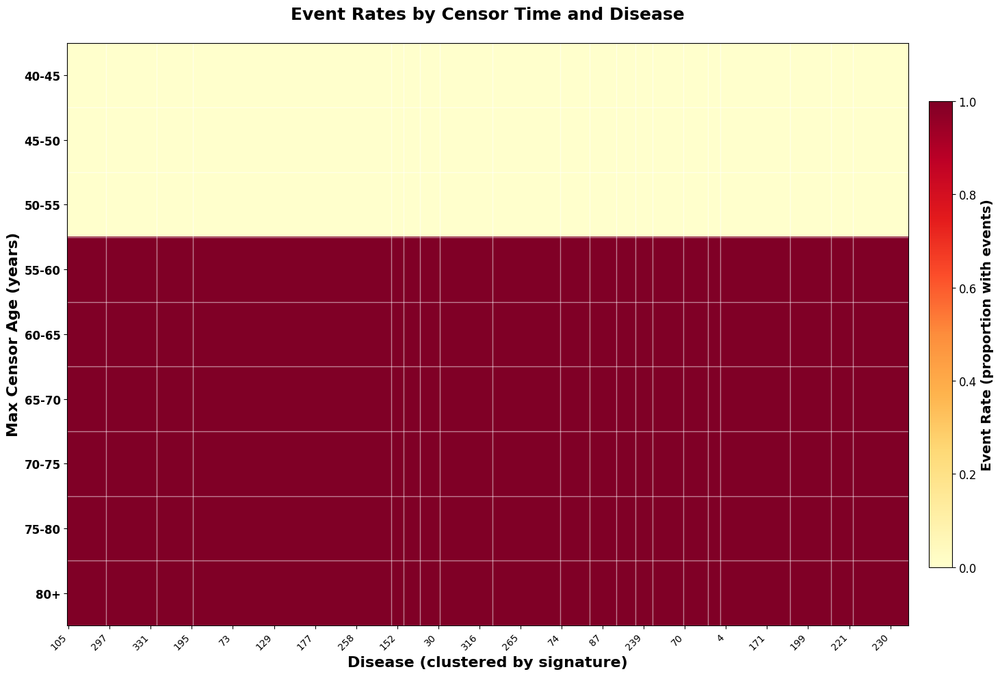

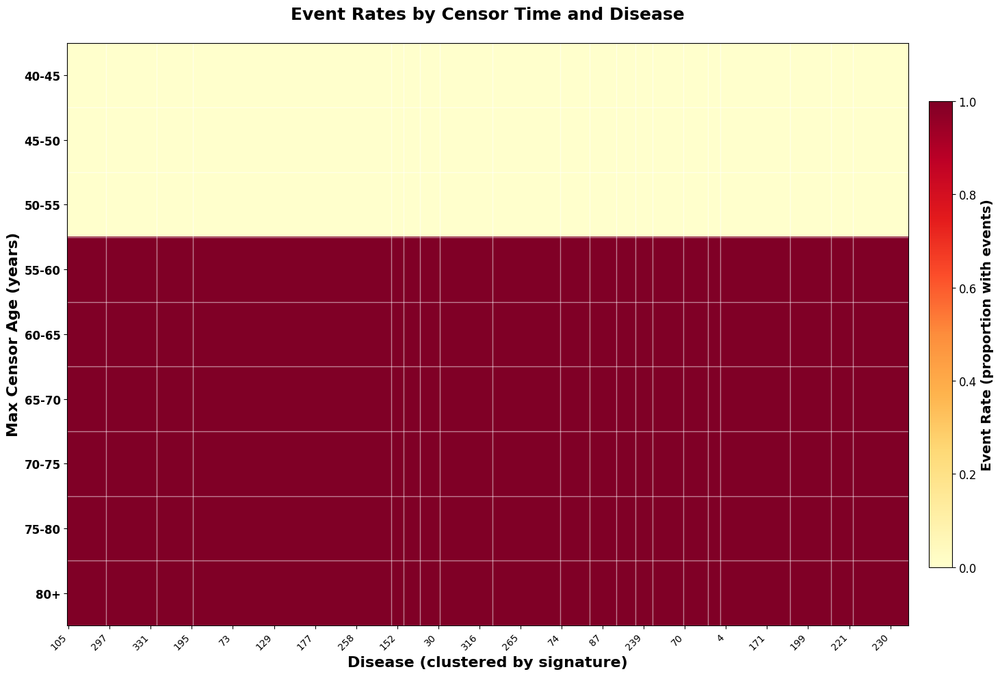

✓ Censor time heatmap created!
  Shows event rates for 9 censor age bins × 348 diseases
  Diseases ordered by signature (same as Panel B/C)


In [ ]:
# Create the heatmap
fig, ax = plt.subplots(1, 1, figsize=(16, 10))

# Reorder diseases by signature (same as before) for better visualization
# Load clusters
ukb_checkpoint_ref = torch.load('/Users/sarahurbut/Dropbox-Personal/model_with_kappa_bigam.pt', 
                                 map_location='cpu', weights_only=False)
clusters = ukb_checkpoint_ref['clusters']
if torch.is_tensor(clusters):
    clusters = clusters.detach().cpu().numpy()

# Group diseases by signature and sort by signature
sig_to_diseases = {}
for d in range(len(clusters)):
    sig = clusters[d]
    if sig not in sig_to_diseases:
        sig_to_diseases[sig] = []
    sig_to_diseases[sig].append(d)

# Create ordered list: diseases grouped by signature
disease_order = []
for sig in sorted(sig_to_diseases.keys()):
    disease_order.extend(sig_to_diseases[sig])

# Reorder heatmap data
heatmap_data_ordered = heatmap_data[:, disease_order]  # Shape: (n_bins, D)

# Create heatmap - use a diverging colormap to show early vs late events
# Lower values (early events) = blue, Higher values (late/censored) = red
vmin_E = 0
vmax_E = T - 1  # Max possible E value

im = ax.imshow(heatmap_data_ordered, aspect='auto', cmap='RdYlBu_r', 
               vmin=vmin_E, vmax=vmax_E, interpolation='nearest')

# Set labels
ax.set_xlabel('Disease (clustered by signature)', fontsize=16, fontweight='bold')
ax.set_ylabel('Max Censor Age (years)', fontsize=16, fontweight='bold')
ax.set_title('Average Event/Censor Times by Censor Age and Disease', 
             fontsize=18, fontweight='bold', pad=25)

# Set y-axis ticks (censor age bins)
ax.set_yticks(np.arange(len(age_bin_labels)))
ax.set_yticklabels(age_bin_labels, fontsize=12, fontweight='bold')

# Set x-axis ticks (show fewer disease labels)
n_diseases = len(disease_order)
x_tick_interval = max(1, n_diseases // 20)  # Show ~20 labels
x_tick_indices = np.arange(0, n_diseases, x_tick_interval)
ax.set_xticks(x_tick_indices)
ax.set_xticklabels([f'{disease_order[i]}' for i in x_tick_indices], fontsize=10, rotation=45, ha='right')

# Add colorbar
cbar = fig.colorbar(im, ax=ax, label='Event/Censor Time', pad=0.02, shrink=0.8)
cbar.ax.tick_params(labelsize=12)
cbar.set_label('Average Event/Censor Time (timepoints)', fontsize=14, fontweight='bold')

# Add horizontal lines to separate censor age bins
for i in range(len(age_bin_labels) + 1):
    ax.axhline(i - 0.5, color='white', linewidth=1, alpha=0.5)

# Add vertical lines to separate signature groups
current_x = 0
for sig in sorted(sig_to_diseases.keys()):
    n_diseases_in_sig = len(sig_to_diseases[sig])
    if current_x > 0:
        ax.axvline(current_x - 0.5, color='white', linewidth=1, alpha=0.5)
    current_x += n_diseases_in_sig

plt.tight_layout()

# Display the figure
from IPython.display import display
display(fig)
plt.show()

print("✓ Censor time heatmap created!")
print(f"  Shows average E values (event/censor times) for {len(age_bin_labels)} censor age bins × {D} diseases")
print(f"  Diseases ordered by signature (same as Panel B/C)")
print(f"  Color: Blue = early events, Red = late events/censoring")


## Plot MGB/AOU Model Phi with Empirical Hazards

Plot the model's learned phi values alongside empirical hazards from raw ICD10 data.
This demonstrates that the model captures empirical patterns, addressing competing risk concerns.
